# Preprocesamiento de datos

Se cargan los datos

In [49]:
import pandas as pd

df = pd.read_csv("nacional.csv")
df.count()

anio          23721
sem           23721
enfermedad    23721
casos         23721
cie           23721
dtype: int64

In [50]:
df.describe()

,anio,sem,casos
count,23721.000000,23721.000000,2.372100e+04
mean,2010.312803,27.393238,1.298015e+04
std,3.183597,14.744562,6.854490e+04
min,2005.000000,1.000000,0.000000e+00
25%,2007.000000,15.000000,3.000000e+00
50%,2010.000000,28.000000,5.700000e+01
75%,2014.000000,40.000000,7.240000e+02
max,2014.000000,53.000000,1.184372e+06


Se eliminan los registros con campos vacíos

In [51]:
df = df.dropna()
df.count()

anio          23721
sem           23721
enfermedad    23721
casos         23721
cie           23721
dtype: int64

Este es un ejemplo de los datos obtenidos

In [52]:
df.sample(3)

,anio,sem,enfermedad,casos,cie
1122,2005,30,fiebre tifoidea,650,a01.0
1637,2005,42,meningitis,18,g00-g03
20186,2014,25,meningoencefalitis amebiana primaria,0,b60.2


Ahora se registra la derechohabiencia mexicana entre 2005 y 2015

In [53]:
import numpy as np

# http://www3.inegi.org.mx/sistemas/sisept/default.aspx?t=msoc01
derechohabiencia = np.array([49222466, 73558769])

from scipy import stats
import matplotlib.cm as cm

a, b, r, p, e = stats.linregress([2005, 2010], derechohabiencia)
print("y = f(x) = {:.4f} x + {:.4f}".format(a, b))
print("error", e)
print("p = ", p)
print("pendiente {:s}significativa".format("no " if p >= 0.05 else ""))
print("R^2", r**2)

# https://www.inegi.org.mx/datos/?ps=Programas
derechohabiencia = [49222466, a * 2006 + b, a * 2007 + b, a * 2008 + b, a * 2009 + b, 73558769, a * 2011 + b, a * 2012 + b, a * 2013 + b, a * 2014 + b]
derechohabiencia = pd.Series(derechohabiencia)
derechohabiencia

y = f(x) = 4867260.6000 x + -9709635037.0000
error 0.0
p =  0.0
pendiente significativa
R^2 1.0


0    4.922247e+07
1    5.408973e+07
2    5.895699e+07
3    6.382425e+07
4    6.869151e+07
5    7.355877e+07
6    7.842603e+07
7    8.329329e+07
8    8.816055e+07
9    9.302781e+07
dtype: float64

Y se normalizan los casos registrados entre la cantidad de derechohabientes reportada por cada año

In [54]:
for name, group in df.groupby('anio'):
    df.loc[df['anio'] == name, 'casos'] = df.loc[df['anio'] == name, 'casos'] / derechohabiencia[name - 2005]
df.sample(3)

,anio,sem,enfermedad,casos,cie
10882,2010,28,hepatitis virica a,3.956021e-06,b15
8673,2009,20,rubeola,1.455784e-08,b06
13802,2012,19,leptospirosis,1.080519e-07,a27


Una descripción de los datos ayudará a saber si ésta normalización es correcta

In [55]:
df.casos.describe()

count    2.372100e+04
mean     1.847271e-04
std      9.878019e-04
min      0.000000e+00
25%      4.537177e-08
50%      7.520653e-07
75%      9.761558e-06
max      1.724190e-02
Name: casos, dtype: float64

In [56]:
pob = np.array([103263388, 105078018, 106892648, 108707278, 110521908, 112336538, 113856925, 115377312, 116897699, 118418086, 119938473])
pob = pd.Series(pob)

In [57]:
derechohabiencia / pob

0     0.476669
1     0.514758
2     0.551553
3     0.587120
4     0.621519
5     0.654807
6     0.688812
7     0.721921
8     0.754168
9     0.785588
10         NaN
dtype: float64

Ahora, para convertir estos datos en series de tiempo, se convierten las semanas en números consecutivos y se ajustan las semanas después del 2008 puesto que se trata de un año con 53 semanas

In [58]:
df.head(3)

,anio,sem,enfermedad,casos,cie
0,2005,1,colera,0.000000e+00,a00
1,2005,1,dengue clasico,0.000000e+00,a90
2,2005,1,enfermedad febril exantematica,6.094778e-08,u97


Y se eliminan las CIEs sin clasificar

In [59]:
list(df.cie.unique())

['a00',
 'a90',
 'u97',
 'a92.3',
 'b50',
 'u98',
 'b20-b24',
 'a33',
 'a34',
 'a37',
 'a23',
 'a01-a03',
 'a38',
 'i00-i02',
 'a01.0',
 'b15',
 'b16',
 'b17.1',
 'z21',
 'a54.0-a54.2',
 'a04 a08-a09',
 'j00-j06',
 'a05',
 't63 excepto t63.2',
 't60',
 't63.2',
 'a27',
 'a17.0',
 'w54',
 'x20',
 'j12',
 'b51',
 'b26',
 'p35.0',
 'b06',
 'a03',
 'a51-a53',
 'a50',
 'a15-a16',
 'b01',
 'b30',
 'a39.0',
 'g00-g03',
 'a01.1-a02',
 'w55',
 'j09',
 'a04',
 'a91',
 'a06.4',
 'v20-v29 v40-v79',
 'f10-f19',
 'y95',
 'a06.0-a06.3',
 'q00',
 'f50',
 'b77',
 'j45',
 'e01',
 'b37.3-b37.4',
 'a57',
 'k70.3',
 'b69',
 'b30.3',
 'h10',
 'sc_contacto traumatico con avispas',
 'f32',
 'e44.1',
 'e44.0',
 'e40-e43',
 'o24.4',
 'e10',
 'e11-e14',
 'n87.0-n87.1',
 'n87.2',
 'sc_edema proteinuria y otros transt. hipertensivos en el embarazo',
 'y58',
 't67',
 'q01',
 'k70',
 'i60-i67',
 'g30',
 'g20',
 'a40.3',
 'i20',
 'a08.0',
 'b80',
 'a46',
 'b86',
 'q05',
 'j02.0',
 'a77.0',
 'a07.1',
 'k05',
 'w32-w34

In [60]:
df = df.loc[df.cie.str[0:2] != 'sc']
list(df.cie.unique())

['a00',
 'a90',
 'u97',
 'a92.3',
 'b50',
 'u98',
 'b20-b24',
 'a33',
 'a34',
 'a37',
 'a23',
 'a01-a03',
 'a38',
 'i00-i02',
 'a01.0',
 'b15',
 'b16',
 'b17.1',
 'z21',
 'a54.0-a54.2',
 'a04 a08-a09',
 'j00-j06',
 'a05',
 't63 excepto t63.2',
 't60',
 't63.2',
 'a27',
 'a17.0',
 'w54',
 'x20',
 'j12',
 'b51',
 'b26',
 'p35.0',
 'b06',
 'a03',
 'a51-a53',
 'a50',
 'a15-a16',
 'b01',
 'b30',
 'a39.0',
 'g00-g03',
 'a01.1-a02',
 'w55',
 'j09',
 'a04',
 'a91',
 'a06.4',
 'v20-v29 v40-v79',
 'f10-f19',
 'y95',
 'a06.0-a06.3',
 'q00',
 'f50',
 'b77',
 'j45',
 'e01',
 'b37.3-b37.4',
 'a57',
 'k70.3',
 'b69',
 'b30.3',
 'h10',
 'f32',
 'e44.1',
 'e44.0',
 'e40-e43',
 'o24.4',
 'e10',
 'e11-e14',
 'n87.0-n87.1',
 'n87.2',
 'y58',
 't67',
 'q01',
 'k70',
 'i60-i67',
 'g30',
 'g20',
 'a40.3',
 'i20',
 'a08.0',
 'b80',
 'a46',
 'b86',
 'q05',
 'j02.0',
 'a77.0',
 'a07.1',
 'k05',
 'w32-w34',
 'a60.0',
 'n40',
 'i10-i15',
 't68',
 'n30',
 'b97.7',
 'a41.3',
 'j09-j11',
 'i87.2',
 'f10.0',
 't58',


# Series de tiempo

A partir de cada CIE se puede generar una serie de tiempo de los datos donde la variable independiente sea el número de la semana y la dependiente los casos normalizados

In [61]:
df = df.dropna()
df = df.reset_index()

import datetime
# https://stackoverflow.com/questions/34342370/analysing-time-series-in-python-pandas-formatting-error-statsmodels
# https://stackoverflow.com/questions/27032052/how-do-i-properly-set-the-datetimeindex-for-a-pandas-datetime-object-in-a-datafr
# https://stackoverflow.com/questions/17087314/get-date-from-week-number

#group.mask(group.eq('None')).dropna()
#group = group.set_index(pd.DatetimeIndex(group['sem']))
for i in range(len(df)):
    d = str(df.loc[i, 'anio']) + "-W" + str(df.loc[i, 'sem'])
    r = datetime.datetime.strptime(d + '-1', "%Y-W%W-%w")
    df.loc[i,'fecha'] = pd.to_datetime(r)
df = df.set_index(pd.DatetimeIndex(df['fecha']))
df = df.drop('index', axis=1)
df.sample(3)

,anio,sem,enfermedad,casos,cie,fecha
fecha,,,,,,
2008-01-14,2008,2,meningitis,1.880163e-07,g00-g03,2008-01-14
2014-05-12,2014,19,intoxicacion por monoxido de carbono,1.074947e-08,t58,2014-05-12
2012-09-17,2012,38,parotiditis infecciosa,9.964788e-07,b26,2012-09-17


Luego se ponen las semanas secuenciales, por comodidad

In [62]:
df['sem'] = df['sem'] + (df['anio'] - 2005) * 52
df.loc[df['anio'] > 2008, 'sem'] = df.loc[df['anio'] > 2008, 'sem'] + 1
df.sample(3)

,anio,sem,enfermedad,casos,cie,fecha
fecha,,,,,,
2008-09-08,2008,192,tuberculosis respiratoria,0.000004,a15-a16,2008-09-08
2010-11-15,2010,307,infecciones respiratorias agudas,0.009455,j00-j06,2010-11-15
2005-05-02,2005,18,mordeduras por perro,0.000052,w54,2005-05-02


In [63]:
df.tail()

,anio,sem,enfermedad,casos,cie,fecha
fecha,,,,,,
2015-01-05,2014,522,tumor maligno de la mama,1.343684e-06,c50,2015-01-05
2015-01-05,2014,522,tumor maligno del cuello del utero,6.234695e-07,c53,2015-01-05
2015-01-05,2014,522,ulceras gastritis y duodenitis,1.751949e-04,k25-k29,2015-01-05
2015-01-05,2014,522,varicela,2.396058e-05,b01,2015-01-05
2015-01-05,2014,522,vulvovaginitis inespecifica,4.146072e-05,a76.0,2015-01-05


Y se muestran sus valores

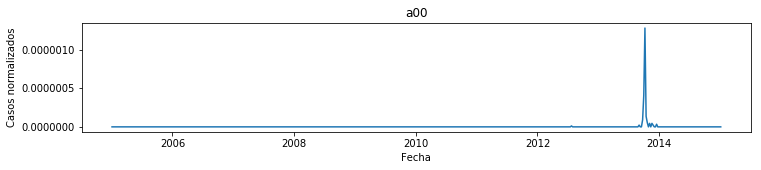

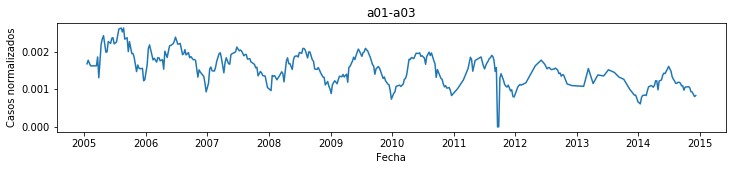

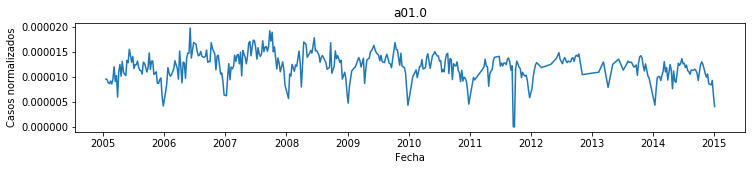

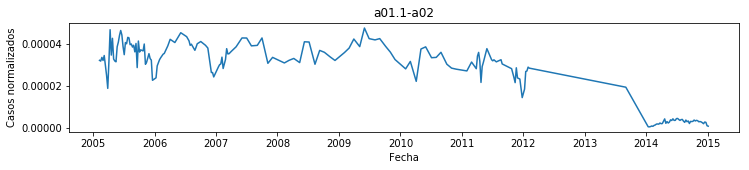

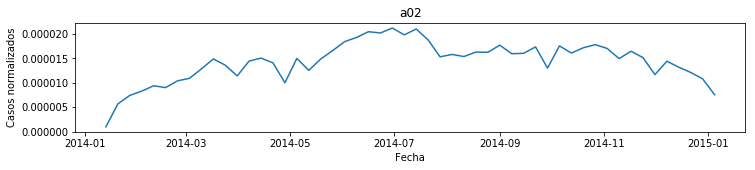

...

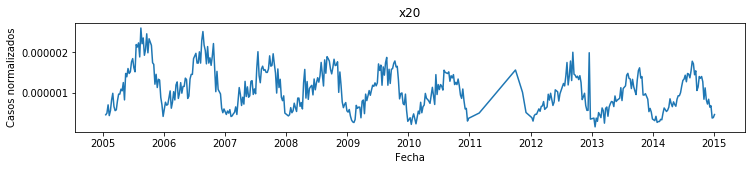

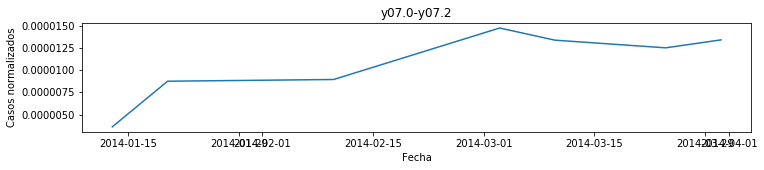

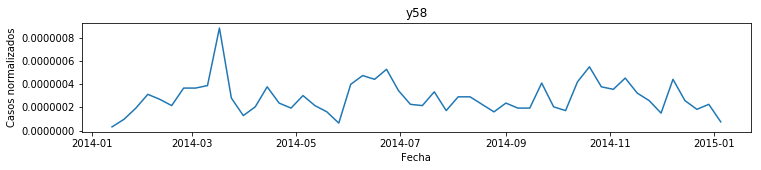

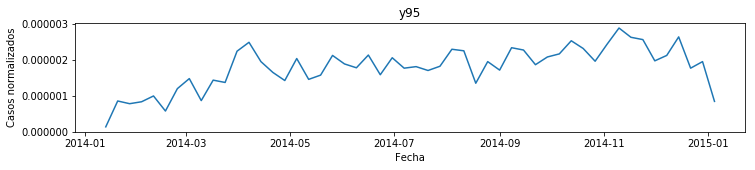

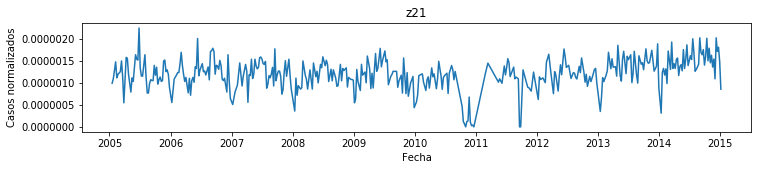

In [64]:
import matplotlib as mpl 
import matplotlib.pyplot as plt
import statsmodels.api as sm

cie = df.groupby('cie')
for name, group in cie:    
    plt.figure(figsize=(12, 2))
    plt.plot(group['fecha'], group.casos)
    plt.title(name)
    plt.xlabel("Fecha")
    plt.ylabel("Casos normalizados")
    plt.show()


Y lo mismo para las CIEs generales (primera letra de la CIE)

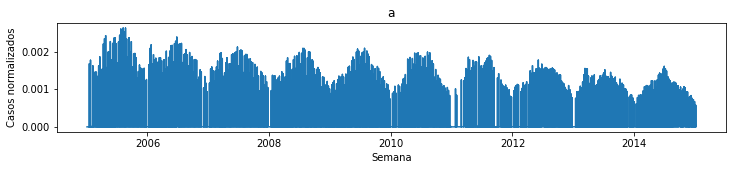

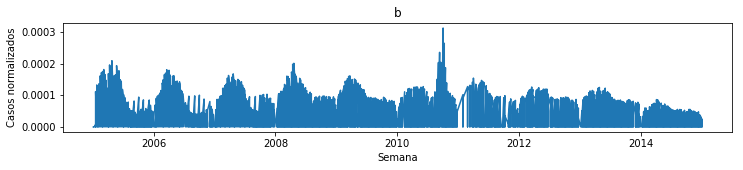

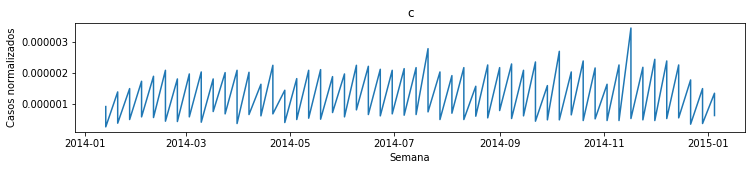

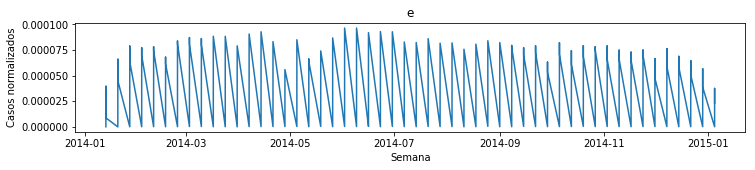

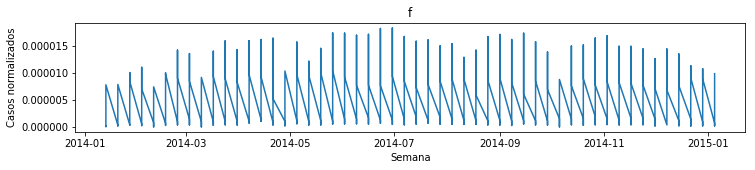

...

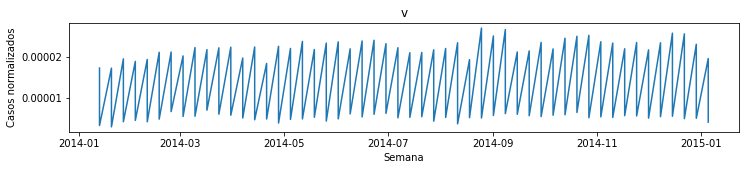

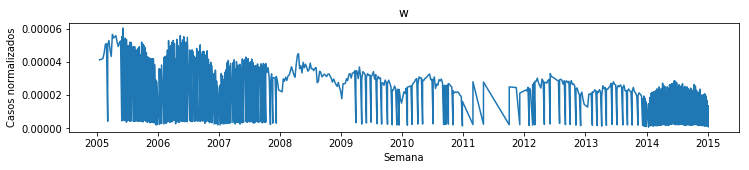

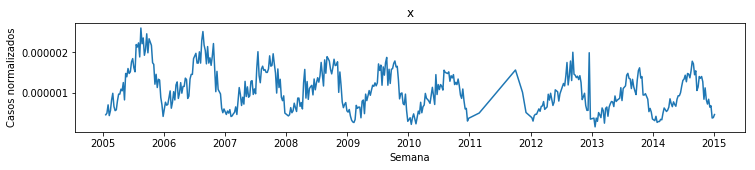

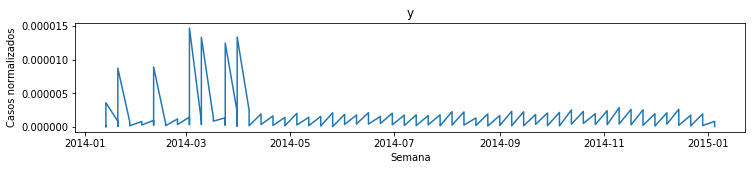

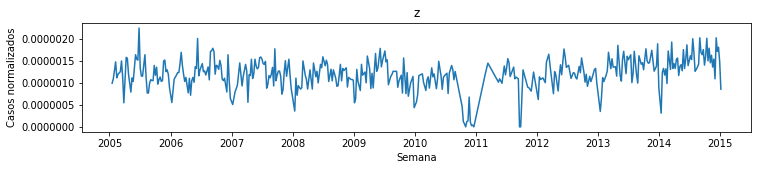

In [65]:
cieG = df.groupby(df.cie.str[0]) # Por CIE general

for name, group in cieG:
    plt.figure(figsize=(12, 2))
    plt.plot(group['fecha'], group.casos)
    plt.title(name)
    plt.xlabel("Semana")
    plt.ylabel("Casos normalizados")
    plt.show()

De entre estas series de tiempo, no todas contienen información de casos reportados durante el periodo de tiempo establecido para la investigación, por lo que se extraen los que reportan al menos la mitad del periodo (260 semanas)

In [66]:
# https://stackoverflow.com/questions/26911851/how-to-use-pandas-to-find-consecutive-same-data-in-time-series

consecutives = cie.apply(lambda x: ((x['fecha'].diff(1) != '7 days').astype('int').cumsum()))
# https://stackoverflow.com/questions/54039062/pandas-check-time-series-continuity
for name, group in cie:
    try:
        s = group['fecha'].asfreq('7d')
        s1 = pd.Series(s[s.isnull()].index)
        # https://stackoverflow.com/questions/17764619/pandas-dataframe-group-year-index-by-decade
        out = s1.dt.week.groupby((s1.dt.year//5)*5).apply(list)
        print(out)
    except:
        print("No se pudo con " + name)

fecha
2005    [27, 48, 49, 1, 2, 7, 11, 15, 20, 24, 28, 33, ...
2010    [1, 5, 6, 9, 14, 18, 1, 2, 3, 6, 7, 8, 9, 10, ...
Name: fecha, dtype: object
fecha
2005    [5, 7, 8, 9, 10, 14, 18, 22, 27, 31, 36, 40, 4...
2010    [1, 5, 6, 9, 14, 18, 20, 22, 27, 31, 35, 40, 4...
Name: fecha, dtype: object
fecha
2005    [1, 27, 48, 1, 49, 1, 2, 7, 11, 15, 20, 24, 28...
2010    [1, 5, 6, 9, 14, 18, 20, 1, 2, 3, 6, 7, 8, 9, ...
Name: fecha, dtype: object
fecha
2005    [42, 47, 52, 1, 7, 10, 11, 13, 15, 16, 17, 19,...
2010    [1, 2, 3, 4, 6, 7, 8, 10, 11, 12, 13, 15, 16, ...
Name: fecha, dtype: object
Series([], Name: fecha, dtype: float64)
fecha
2005                             [1, 27, 48, 1, 1, 2, 51]
2010    [1, 6, 36, 37, 38, 1, 2, 3, 6, 7, 8, 10, 31, 3...
Name: fecha, dtype: object
fecha
2010    [1, 6, 52, 1, 2, 3, 6, 7, 8, 10, 16, 23, 24, 2...
Name: fecha, dtype: object
fecha
2005    [5, 1, 27, 48, 1, 1, 2]
Name: fecha, dtype: object
fecha
2005                              [5, 1, 27, 48, 1, 1

Name: fecha, dtype: object
fecha
2005    [11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 3...
2010    [1, 2, 3, 4, 6, 7, 8, 10, 11, 12, 13, 15, 16, ...
Name: fecha, dtype: object
fecha
2005                          [1, 5, 27, 48, 1, 12, 1, 2]
2010    [1, 6, 20, 22, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11,...
Name: fecha, dtype: object
fecha
2010    [5, 6, 8, 9, 12]
Name: fecha, dtype: object
Series([], Name: fecha, dtype: float64)
Series([], Name: fecha, dtype: float64)
fecha
2005    [5, 9, 14, 18, 22, 1, 5, 15, 27, 32, 48, 1, 3,...
2010    [1, 5, 6, 9, 14, 18, 22, 27, 31, 36, 37, 38, 3...
Name: fecha, dtype: object


In [67]:
rows = 0
for n, g in cie:
    rows += len(g)

print(rows)

23617


In [68]:
# https://stackoverflow.com/a/16916611
print('Iniciales {}'.format(len(cie)))
rows = 0
for n, g in cie:
    rows += len(g)

print("Registros iniciales:{}".format(rows))
cie = cie.filter(lambda x: x['fecha'].count() >= 260 )
cie = cie.groupby('cie')
print('Restantes {}'.format(len(cie)))
rows = 0
for n, g in cie:
    rows += len(g)

print("Registros finales:{}".format(rows))

Iniciales 138
Registros iniciales:23617
Restantes 40
Registros finales:17757


In [69]:
print('Iniciales {}'.format(len(cieG))) 
cieG = cieG.filter(lambda x: x['fecha'].count() >= 260 )
cieG = cieG.groupby(cieG.cie.str[0])
print('Restantes {}'.format(len(cieG)))

Iniciales 22
Restantes 12


In [70]:
rows = 0
for n, g in cieG:
    rows += len(g)
rows

22286

Así, de 138 series de tiempo de enfermedades, se obtienen 40 en las que al menos se cuenta con datos semanales de 5 años. Para dichas enfermedades se obtienen los pesos de la regresión lineal y se obtiene la serie de tiempo sin la tendencia y las autocorrelaciones (eliminando la a92.3 porque viene vacía)

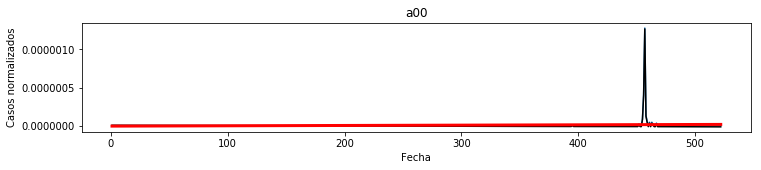

Es estacionaria


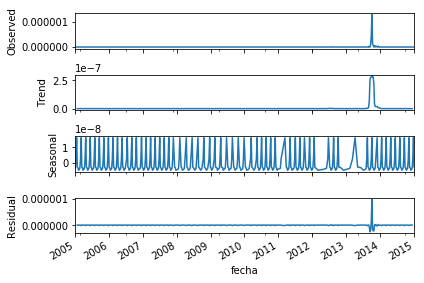

y = f(x) = 4.2687498879775535e-11 x + -5.61276490864389e-09
error 2.0113605583063745e-11
p =  0.0343832558183012
pendiente significativa
R^2 0.010390302941758982


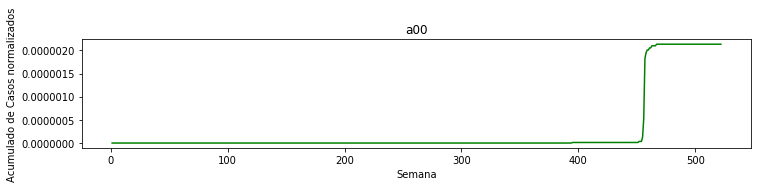

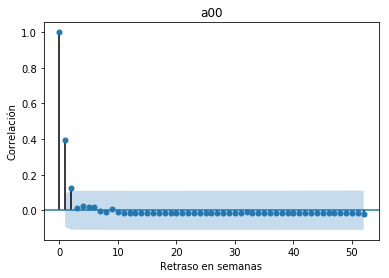

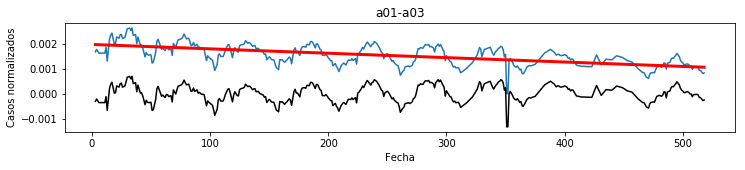

Es estacionaria


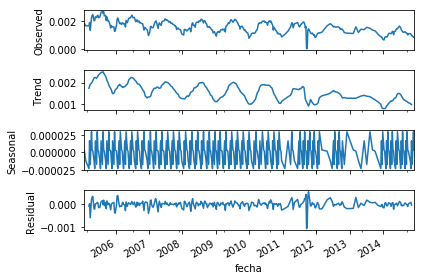

y = f(x) = -1.7653075450894878e-06 x + 0.0019754909758688734
error 1.215881678974069e-07
p =  1.0774404716158359e-37
pendiente significativa
R^2 0.3765563116502909


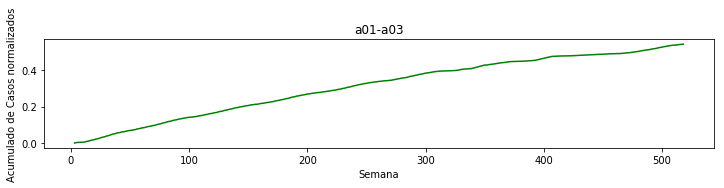

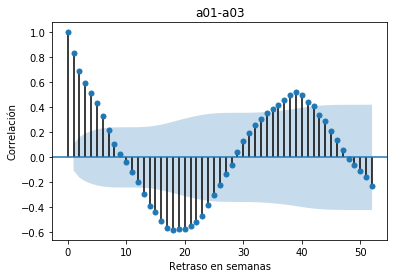

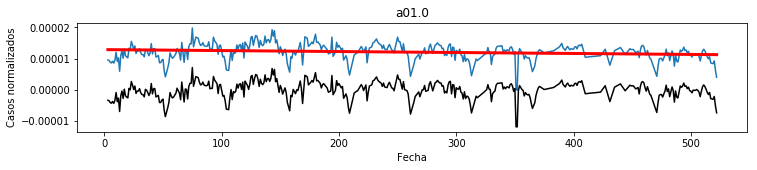

Es estacionaria


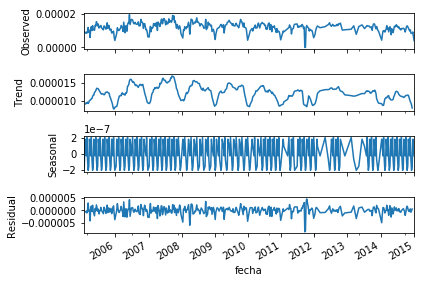

y = f(x) = -3.075233897956854e-09 x + 1.2904965711605356e-05
error 8.367492653856567e-10
p =  0.00026873452367325273
pendiente significativa
R^2 0.03144815483703098


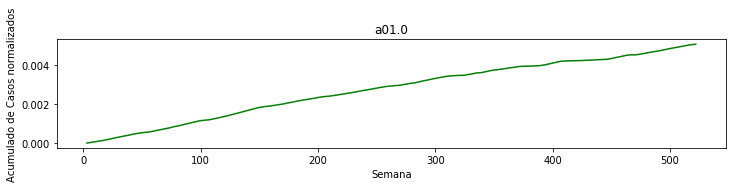

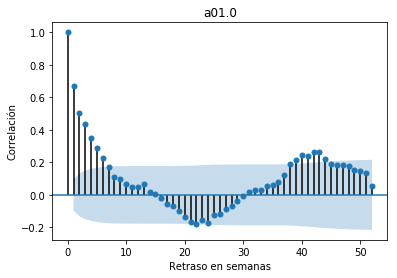

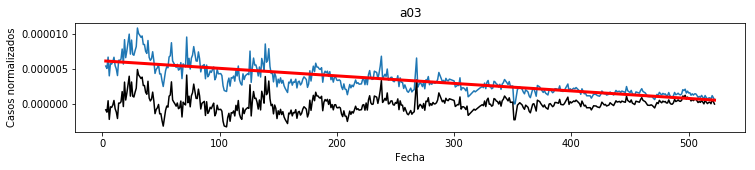

Es estacionaria


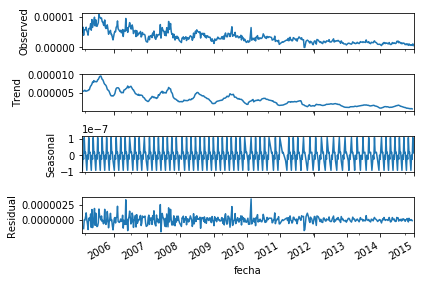

y = f(x) = -1.0785666679174943e-08 x + 6.155839207125693e-06
error 3.56459897012746e-10
p =  3.9269145731826003e-112
pendiente significativa
R^2 0.6622135065357387


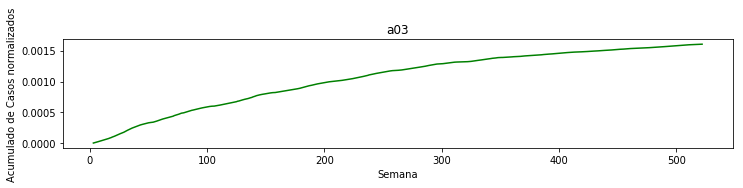

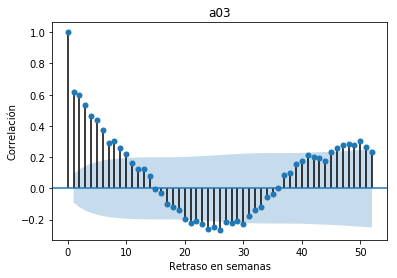

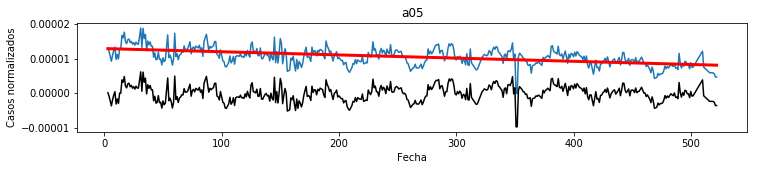

Es estacionaria


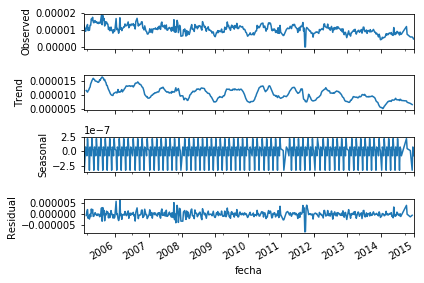

y = f(x) = -9.213574424729245e-09 x + 1.2957954379028175e-05
error 6.75300549213463e-10
p =  4.8635913660396415e-36
pendiente significativa
R^2 0.2798612445705242


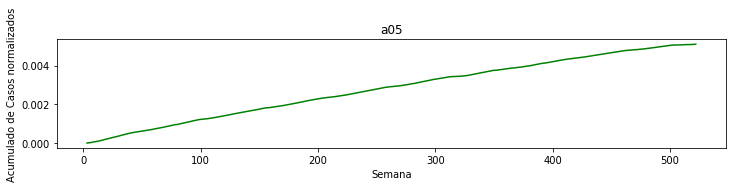

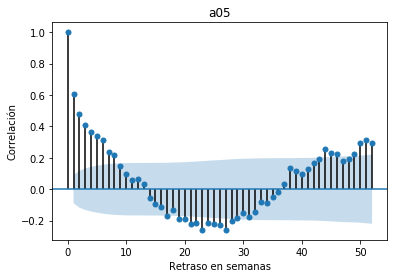

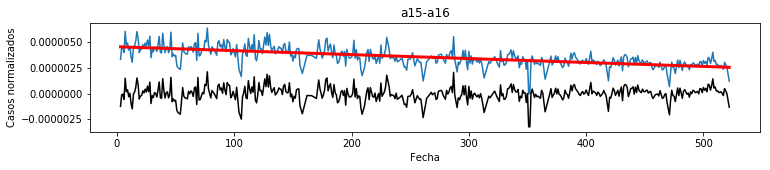

Es estacionaria


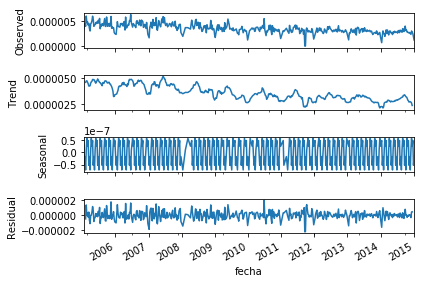

y = f(x) = -3.831012274635741e-09 x + 4.559110665311131e-06
error 2.0566605763246914e-10
p =  2.108376974716991e-58
pendiente significativa
R^2 0.42470905522555363


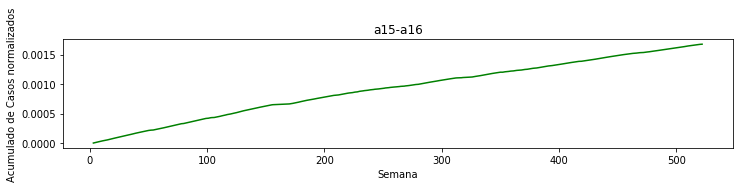

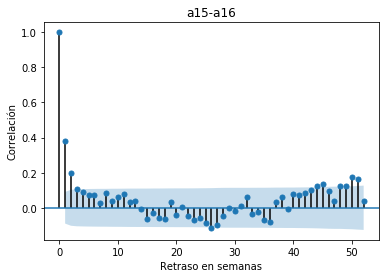

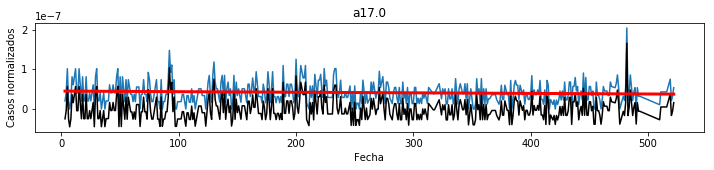

Es estacionaria


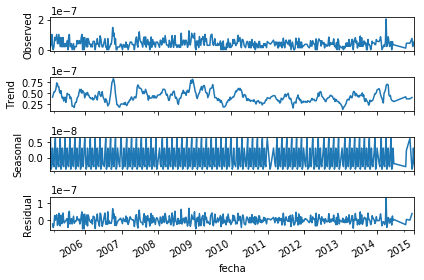

y = f(x) = -1.462772596363818e-11 x + 4.5153183905681134e-08
error 8.616508009598693e-12
p =  0.09023493838847155
pendiente no significativa
R^2 0.006068835261027796


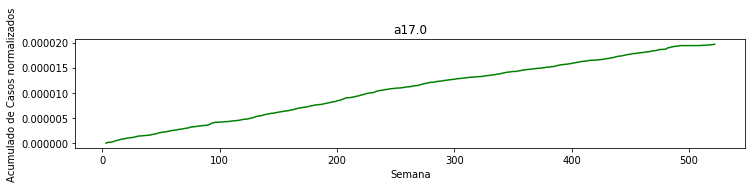

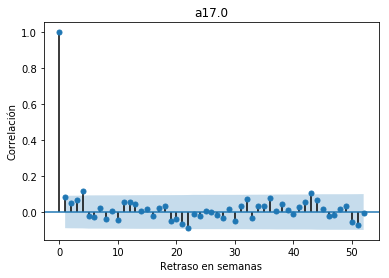

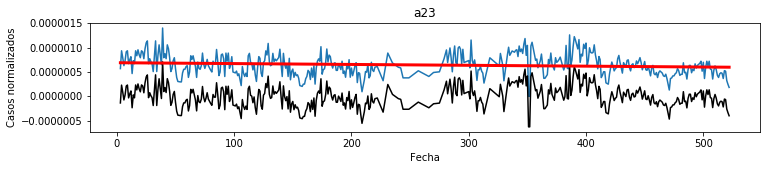

Es estacionaria


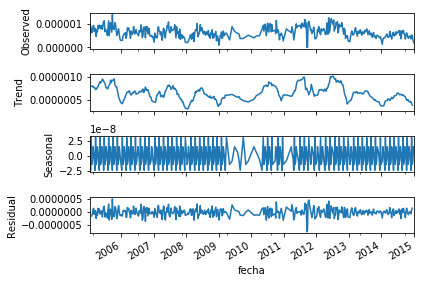

y = f(x) = -1.7642681104091792e-10 x + 6.894953499860091e-07
error 6.403728082254569e-11
p =  0.006112104053430588
pendiente significativa
R^2 0.016996286443800412


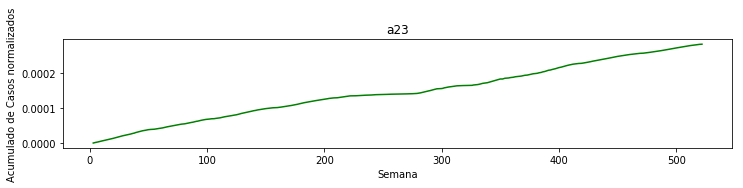

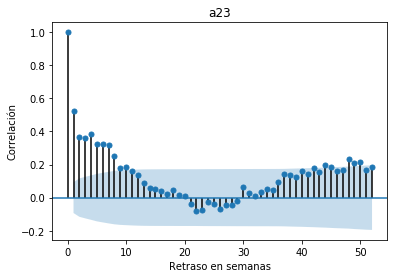

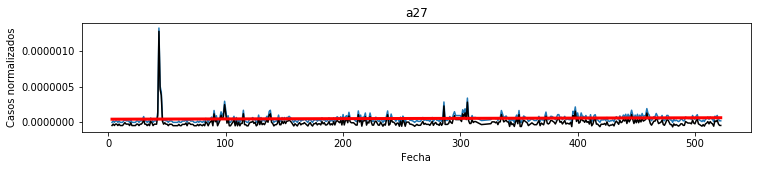

Es estacionaria


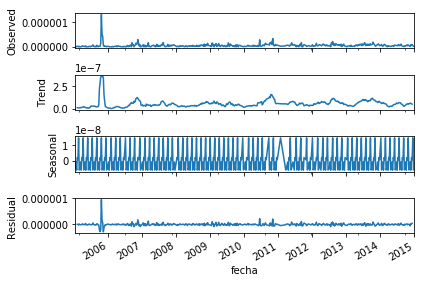

y = f(x) = 3.8938781393720094e-11 x + 4.43243996701369e-08
error 2.3015370193639936e-11
p =  0.09131901816285959
pendiente no significativa
R^2 0.005903509747606774


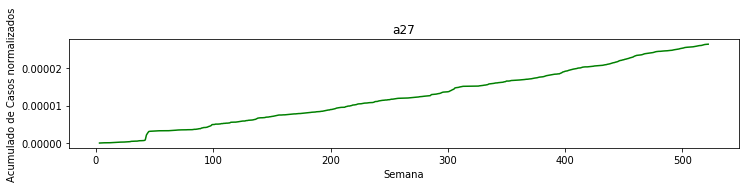

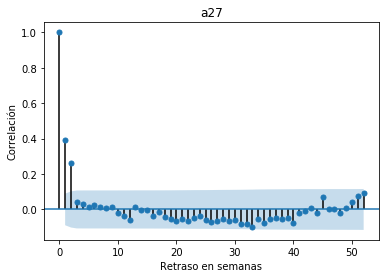

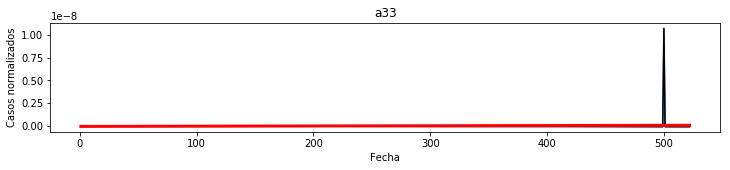

Es estacionaria


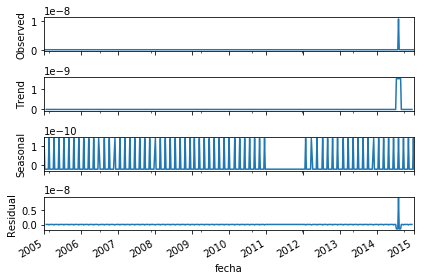

y = f(x) = 2.343470972960994e-13 x + -3.600314787253536e-11
error 1.4786296827402484e-13
p =  0.11367468759790329
pendiente no significativa
R^2 0.005407586602284261


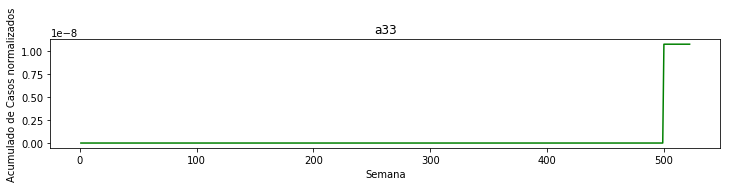

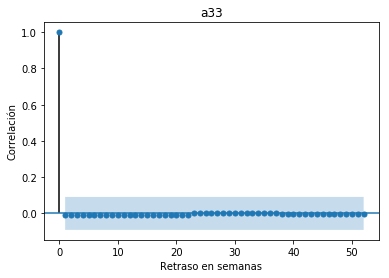

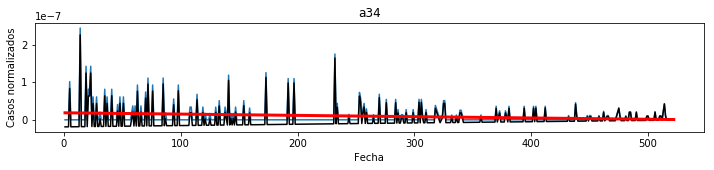

Es estacionaria


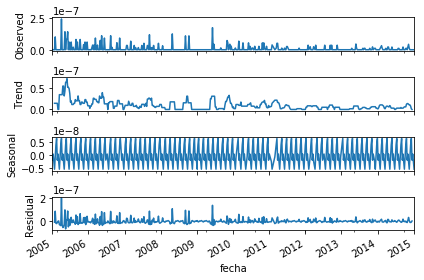

y = f(x) = -3.4234098194666664e-11 x + 1.8622107713377432e-08
error 7.415007265414005e-12
p =  4.945787391949833e-06
pendiente significativa
R^2 0.040422588588555054


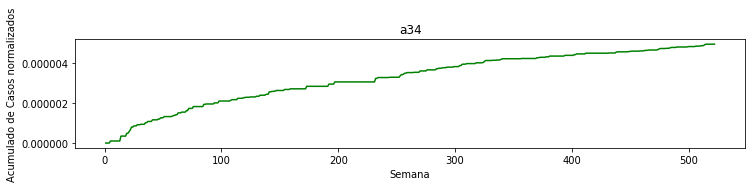

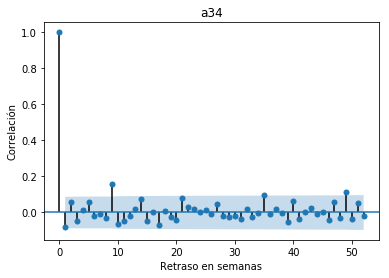

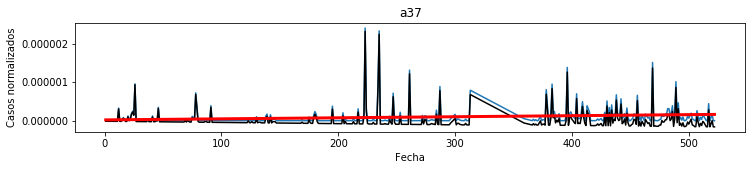

Es estacionaria


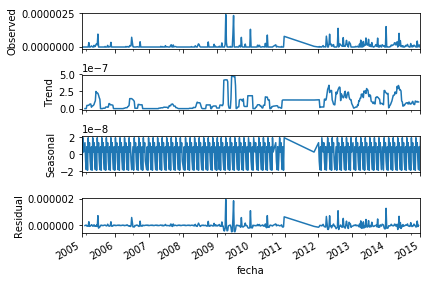

y = f(x) = 2.7254008122999386e-10 x + 1.947194614864018e-08
error 7.110945660238782e-11
p =  0.0001445814666607571
pendiente significativa
R^2 0.031274848966871674


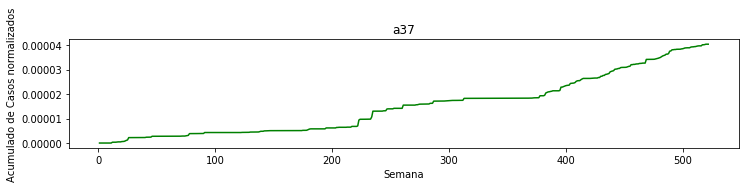

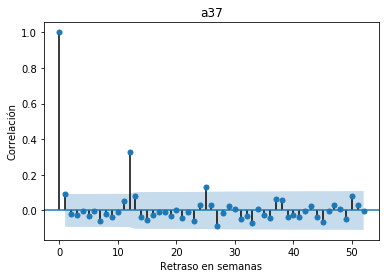

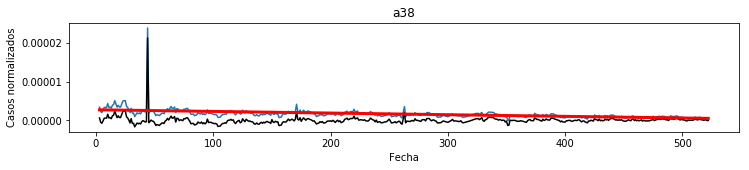

Es estacionaria


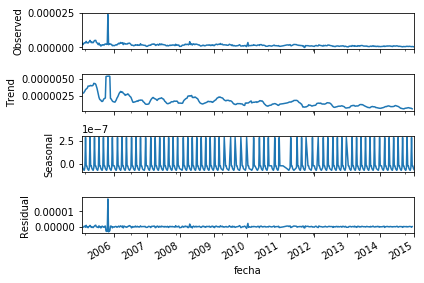

y = f(x) = -4.255464112013023e-09 x + 2.747090370251014e-06
error 3.354855937396755e-10
p =  6.366969283108536e-32
pendiente significativa
R^2 0.25462455709847065


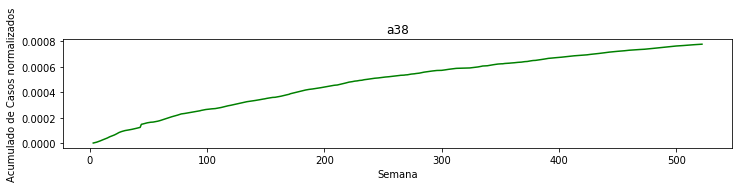

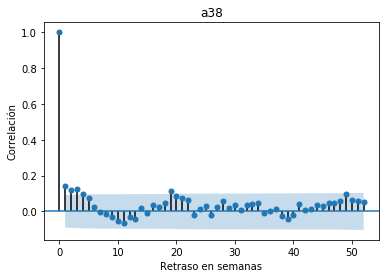

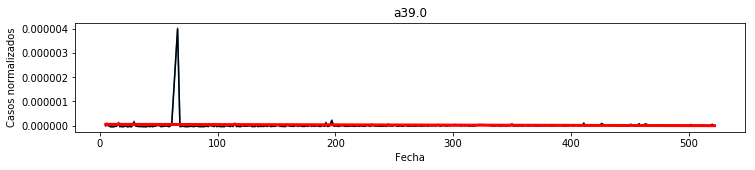

Es estacionaria


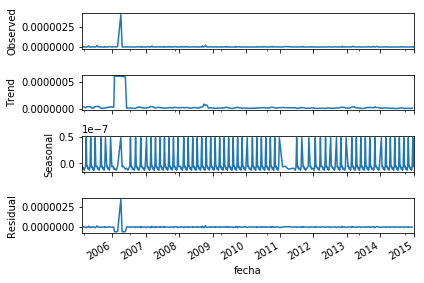

y = f(x) = -1.0744562226275757e-10 x + 5.3269706349552e-08
error 6.010845348981305e-11
p =  0.07452781641973508
pendiente no significativa
R^2 0.007081769917450663


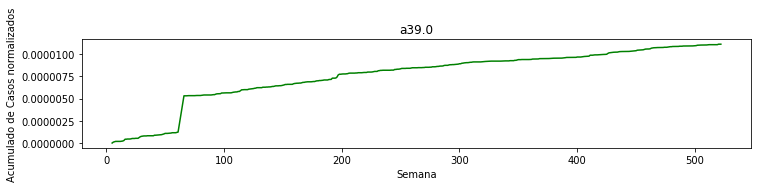

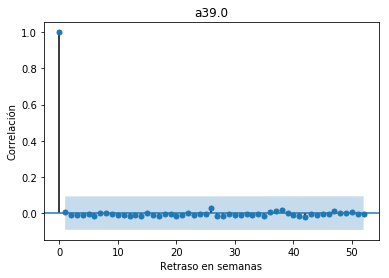

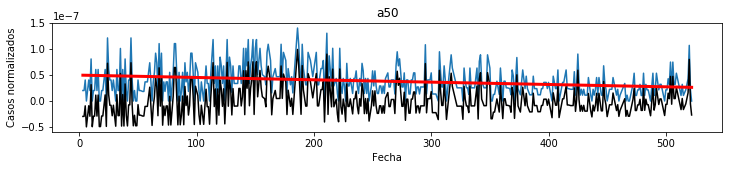

Es estacionaria


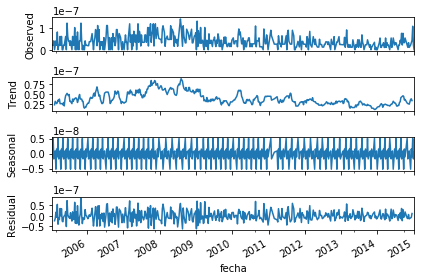

y = f(x) = -4.514429566290533e-11 x + 5.0031096638492665e-08
error 8.825884482273086e-12
p =  4.625709147490937e-07
pendiente significativa
R^2 0.05414963353204723


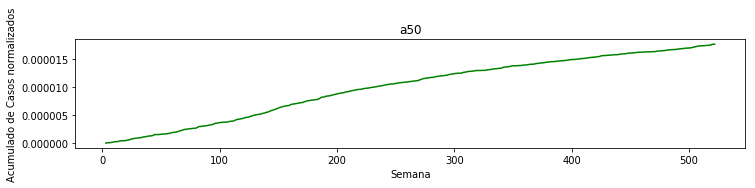

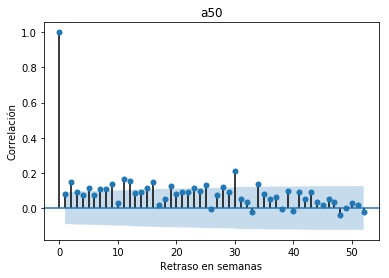

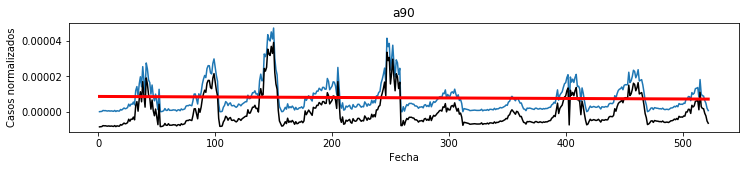

Es estacionaria


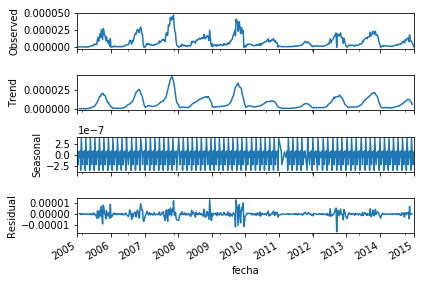

y = f(x) = -2.87576214265131e-09 x + 8.65805695809489e-06
error 2.5195362618720955e-09
p =  0.254256979121671
pendiente no significativa
R^2 0.002603944949826925


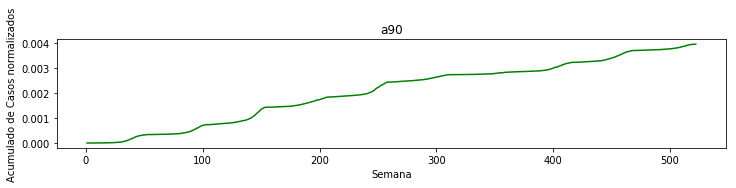

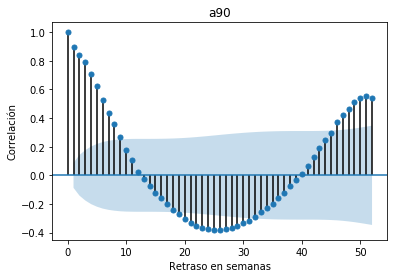

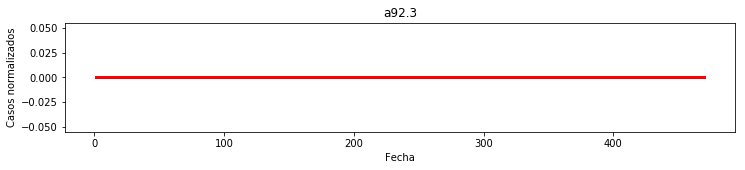

/usr/local/lib/python3.6/dist-packages/statsmodels/regression/linear_model.py:846: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:1100: RuntimeWarning: invalid value encountered in true_divide
  return self.params / self.bse


No estacionaria


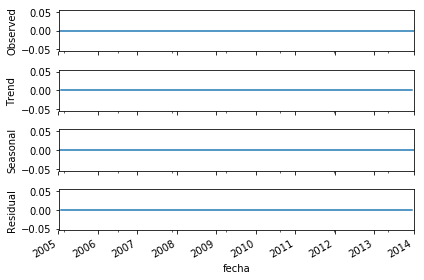

y = f(x) = 0.0 x + 0.0
error 0.0
p =  1.0
pendiente no significativa
R^2 0.0


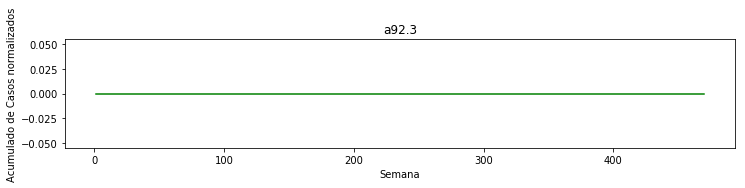

/usr/local/lib/python3.6/dist-packages/statsmodels/tsa/stattools.py:476: RuntimeWarning: invalid value encountered in true_divide
  acf = avf[:nlags + 1] / avf[0]


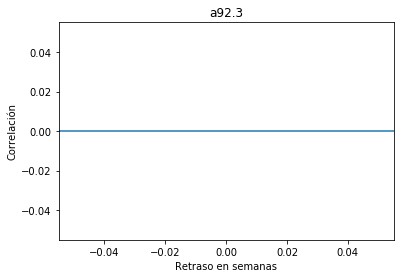

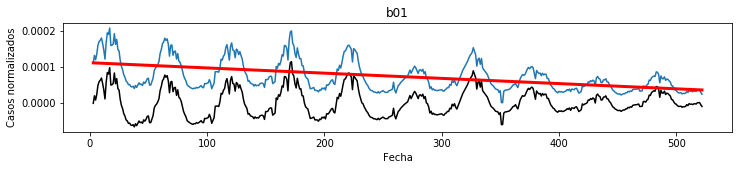

Es estacionaria


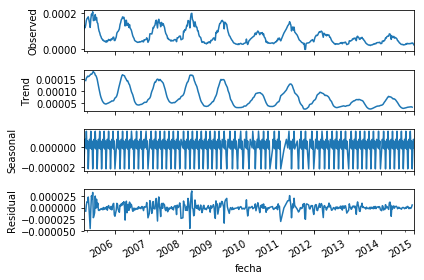

y = f(x) = -1.4644681914017865e-07 x + 0.00011211051217541273
error 1.1228826202874234e-08
p =  2.07507053420651e-33
pendiente significativa
R^2 0.26531932131693736


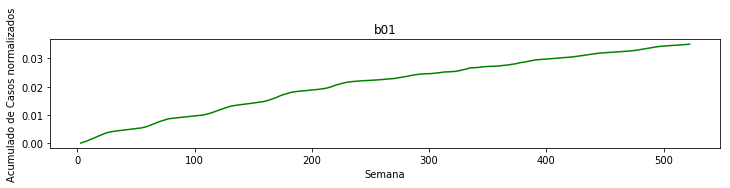

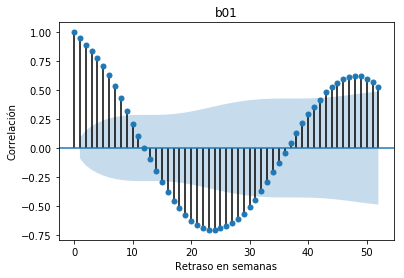

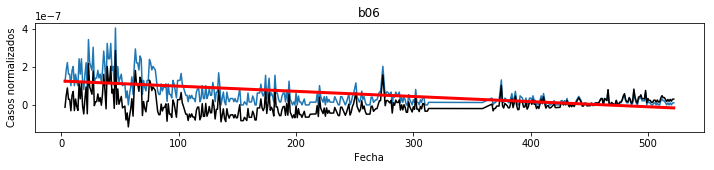

Es estacionaria


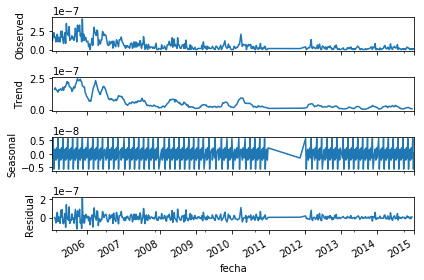

y = f(x) = -2.722125710622441e-10 x + 1.2622941411569838e-07
error 1.5886580696242173e-11
p =  7.301650105437013e-51
pendiente significativa
R^2 0.39858779706929515


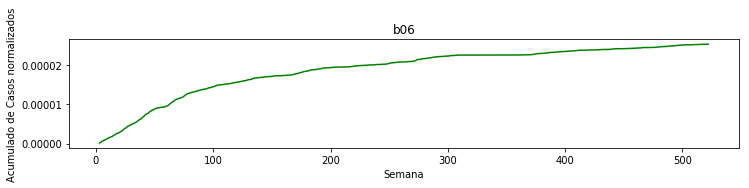

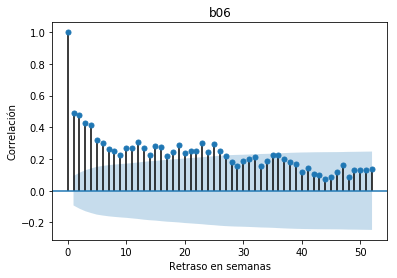

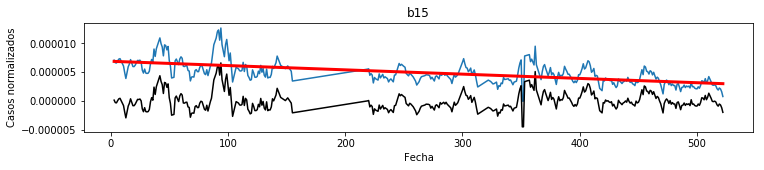

Es estacionaria


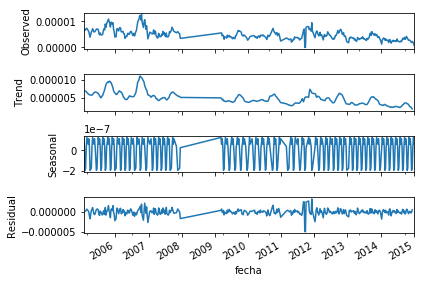

y = f(x) = -7.433434732564663e-09 x + 6.901511580636184e-06
error 4.809110869935852e-10
p =  3.152356534779087e-42
pendiente significativa
R^2 0.384163520846861


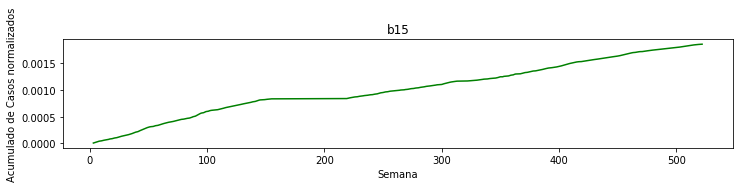

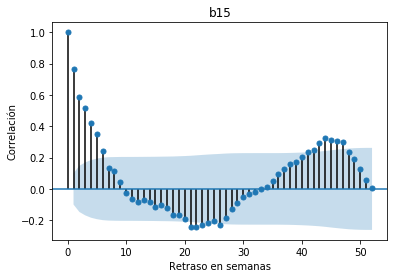

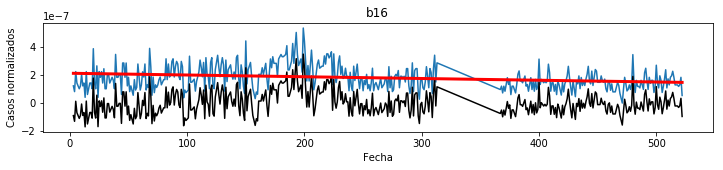

Es estacionaria


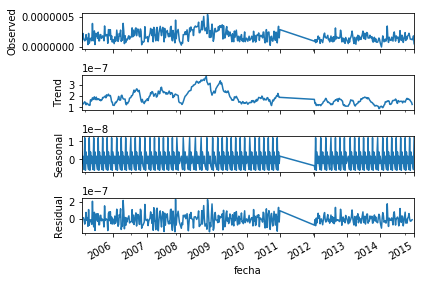

y = f(x) = -1.2411343091809242e-10 x + 2.1160165305354125e-07
error 2.468137006599135e-11
p =  7.21750759835505e-07
pendiente significativa
R^2 0.05458192227303577


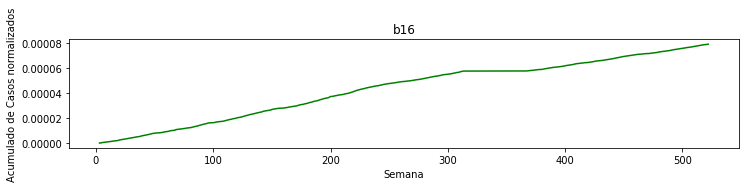

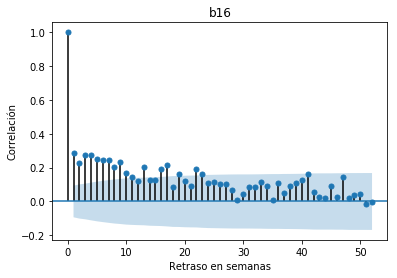

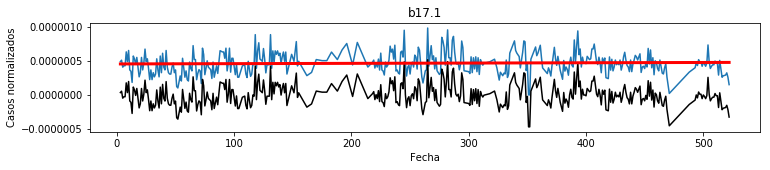

Es estacionaria


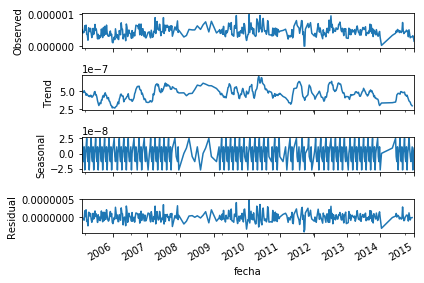

y = f(x) = 4.306189172696874e-11 x + 4.5311776302657916e-07
error 4.983732447188263e-11
p =  0.3880813876059075
pendiente no significativa
R^2 0.0018723188046217507


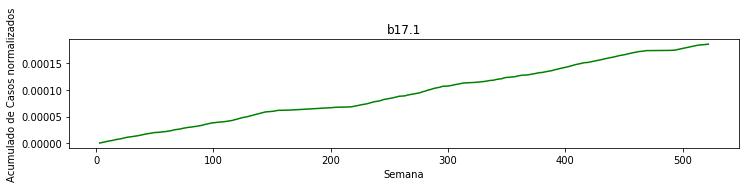

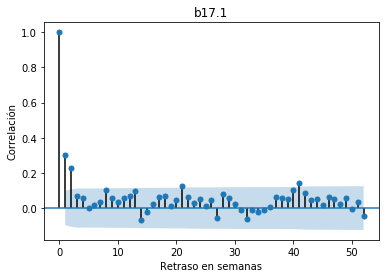

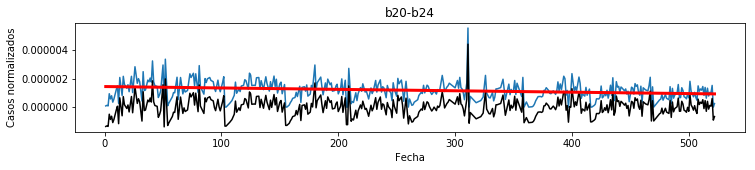

Es estacionaria


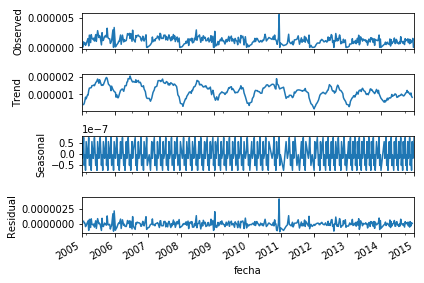

y = f(x) = -9.851452950958728e-10 x + 1.4372871687382767e-06
error 2.0422528814979408e-10
p =  2.0041598520457223e-06
pendiente significativa
R^2 0.054845377515214955


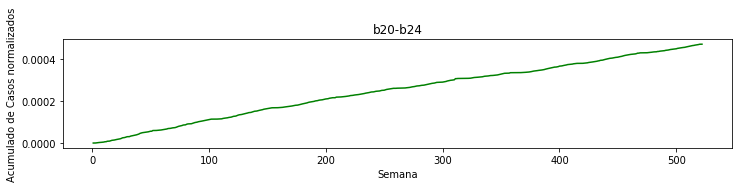

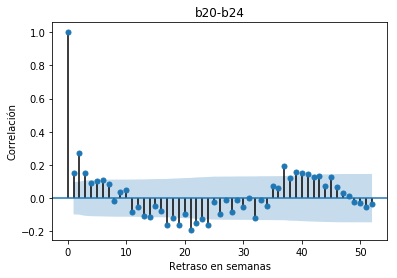

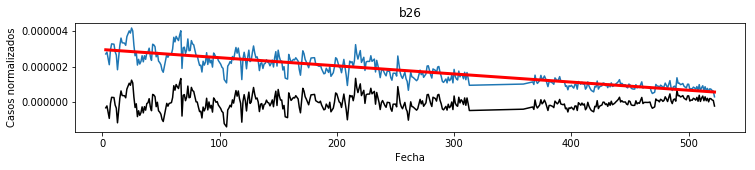

No estacionaria


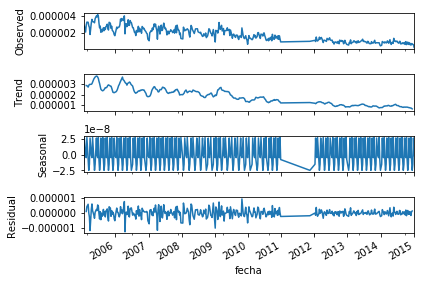

y = f(x) = -4.5977874526241305e-09 x + 2.970356116391645e-06
error 1.220083400034405e-10
p =  5.731116914265102e-137
pendiente significativa
R^2 0.7713322815069265


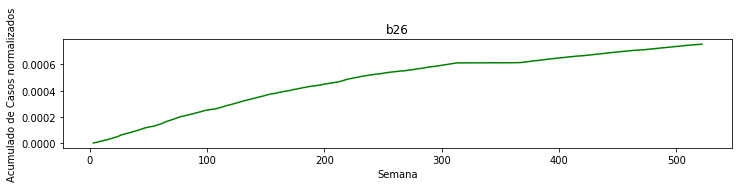

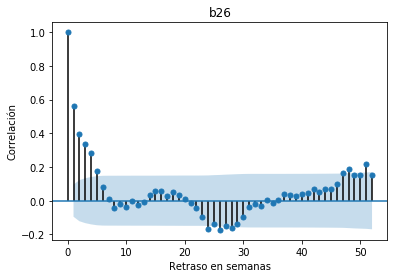

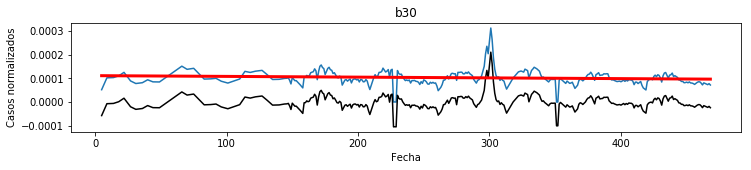

Es estacionaria


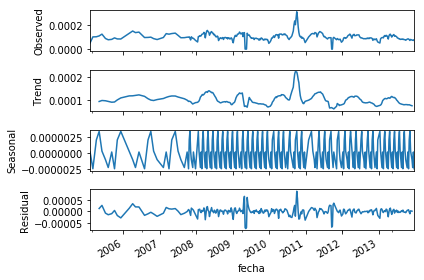

y = f(x) = -3.141197049928085e-08 x + 0.00011159382796415527
error 1.555599789385595e-08
p =  0.0443236920903765
pendiente significativa
R^2 0.013065683803978843


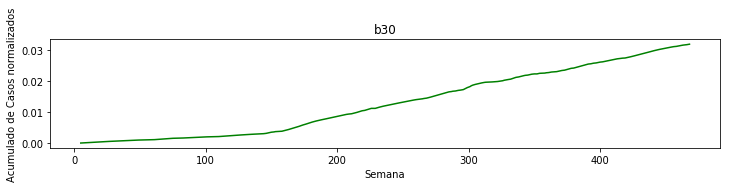

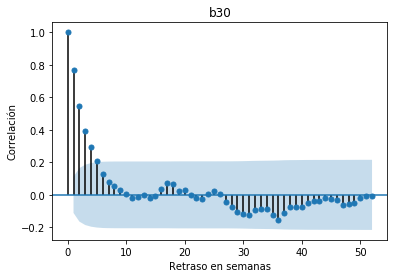

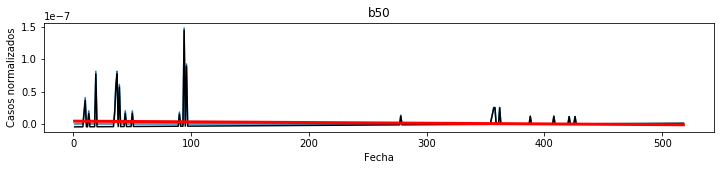

Es estacionaria


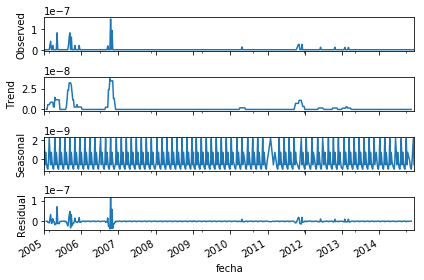

y = f(x) = -1.0673850709576887e-11 x + 4.355250762325799e-09
error 3.1880871555405894e-12
p =  0.0008764994132686583
pendiente significativa
R^2 0.022364679601806485


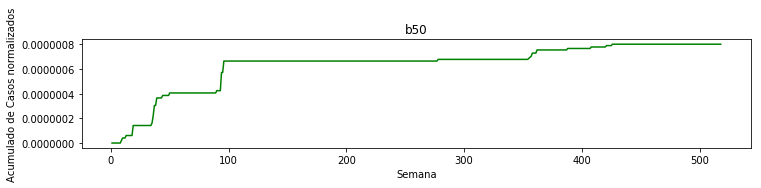

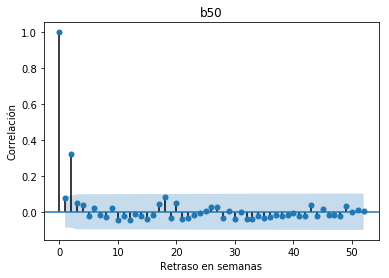

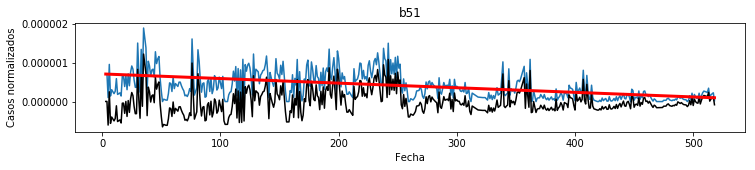

Es estacionaria


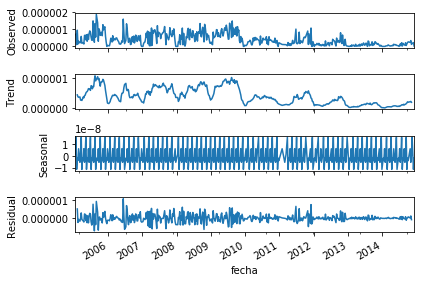

y = f(x) = -1.1834633525276112e-09 x + 7.100912129285128e-07
error 9.393463801467682e-11
p =  1.2559331815197292e-31
pendiente significativa
R^2 0.2492889410428307


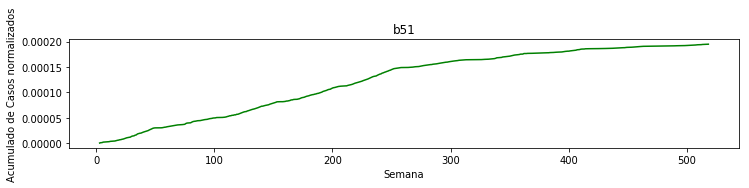

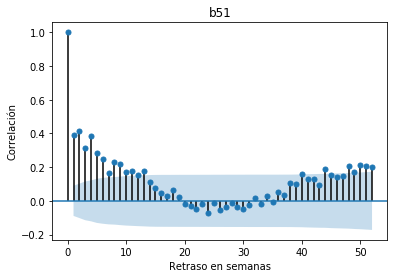

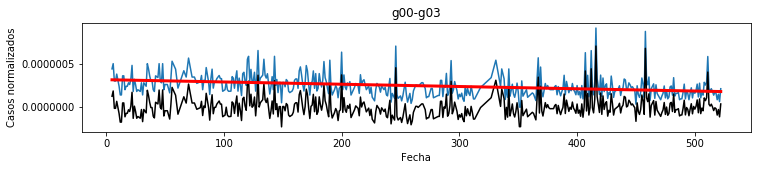

Es estacionaria


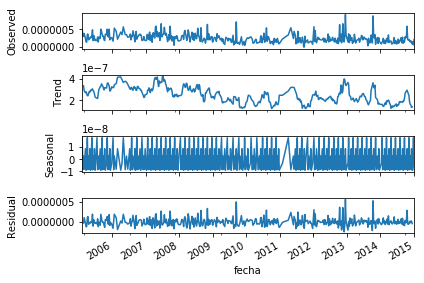

y = f(x) = -2.6544241562890327e-10 x + 3.2049521522763566e-07
error 3.731911894130848e-11
p =  4.610321182741759e-12
pendiente significativa
R^2 0.10270484494415091


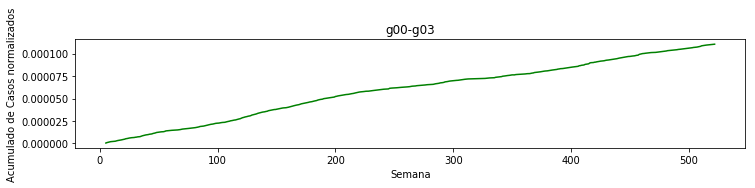

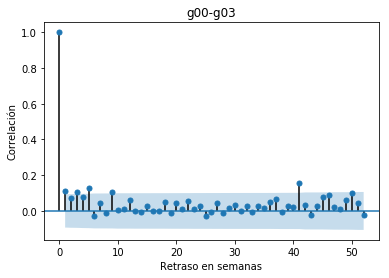

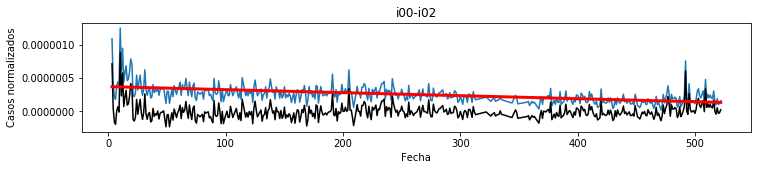

Es estacionaria


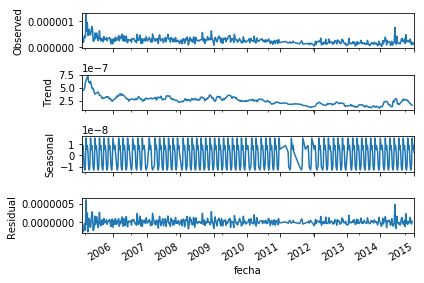

y = f(x) = -4.5561720468005784e-10 x + 3.7500114147077786e-07
error 3.423510008372157e-11
p =  1.854831456163654e-34
pendiente significativa
R^2 0.276261664198788


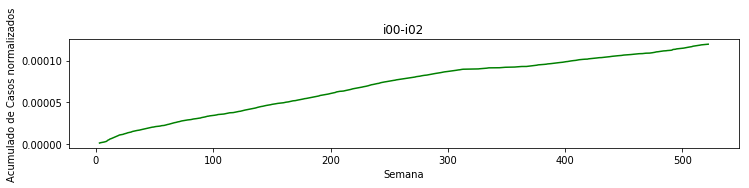

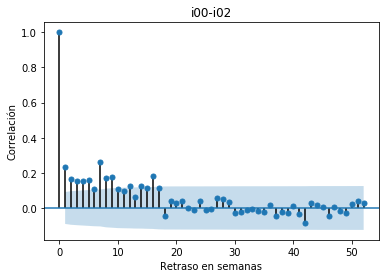

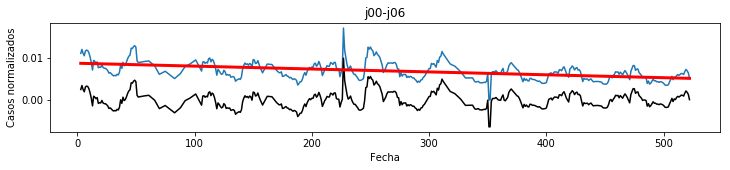

Es estacionaria


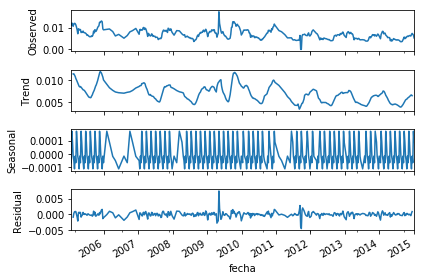

y = f(x) = -6.932314608726672e-06 x + 0.008805967823835786
error 6.162044690299544e-07
p =  7.503334430144021e-26
pendiente significativa
R^2 0.231138732769624


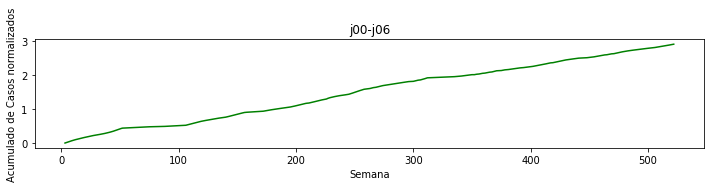

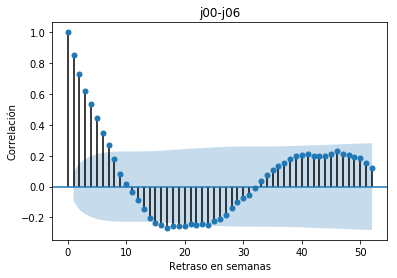

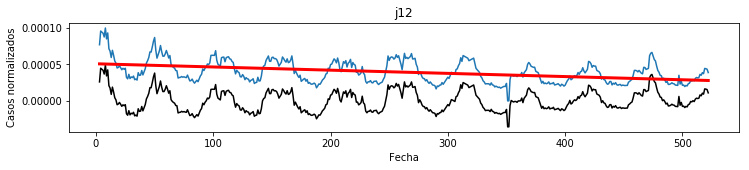

Es estacionaria


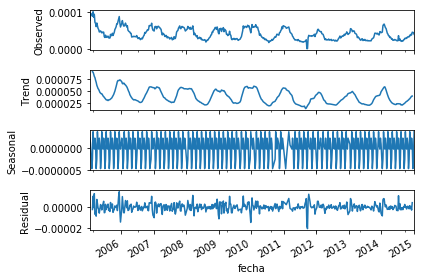

y = f(x) = -4.3876585629436324e-08 x + 5.08928603405923e-05
error 4.181979380800392e-09
p =  2.3727736779313174e-23
pendiente significativa
R^2 0.1846709286259034


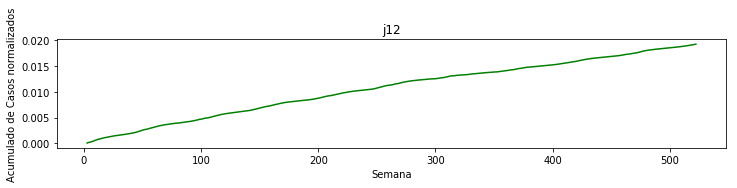

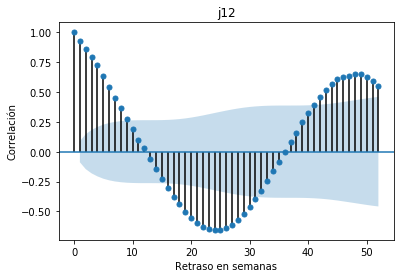

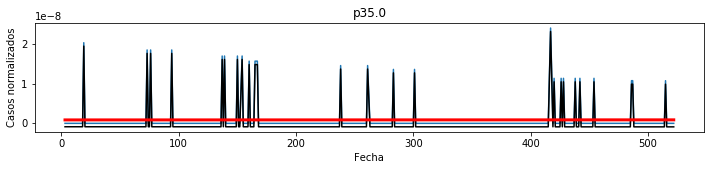

Es estacionaria


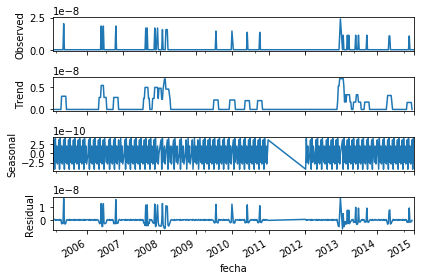

y = f(x) = 3.0607452607643746e-14 x + 8.632235917582137e-10
error 1.0811257202089338e-12
p =  0.9774272215311792
pendiente no significativa
R^2 1.8298987789070766e-06


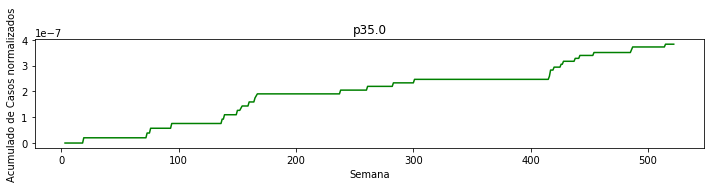

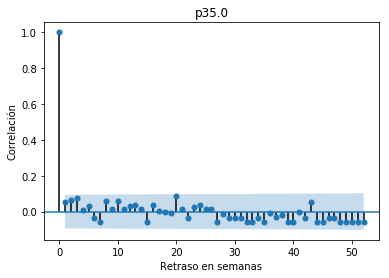

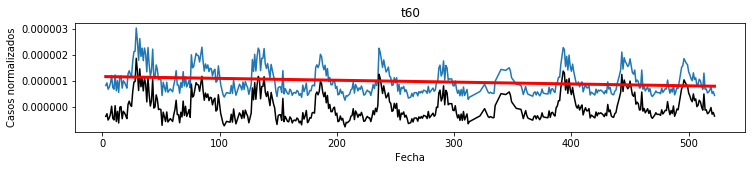

Es estacionaria


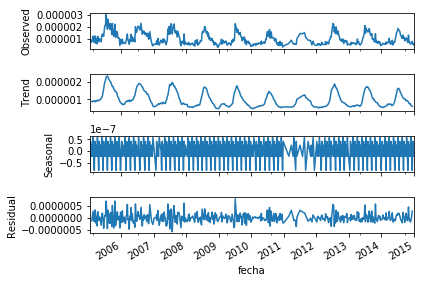

y = f(x) = -7.142618310354189e-10 x + 1.178302593061399e-06
error 1.4579442954450121e-10
p =  1.3323297837772373e-06
pendiente significativa
R^2 0.04918267323938661


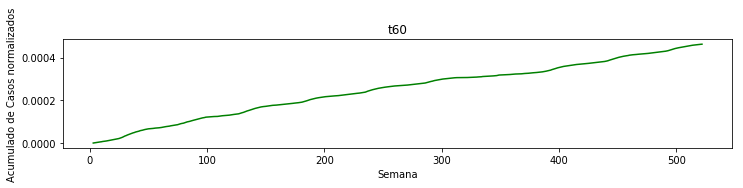

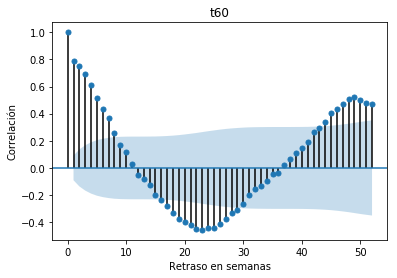

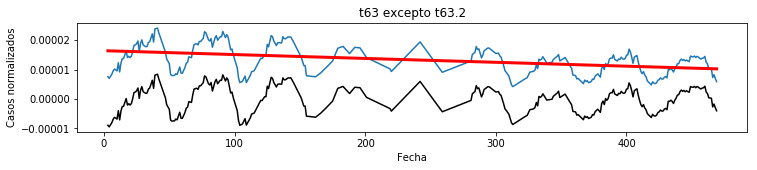

Es estacionaria


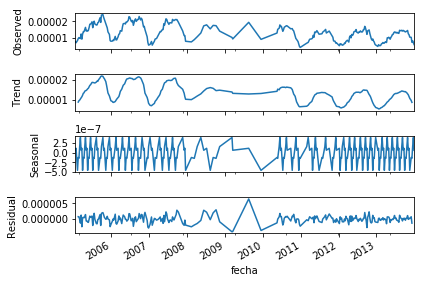

y = f(x) = -1.31589878008604e-08 x + 1.6434450257999083e-05
error 1.6084785128648309e-09
p =  1.0885896084621635e-14
pendiente significativa
R^2 0.19747207526346672


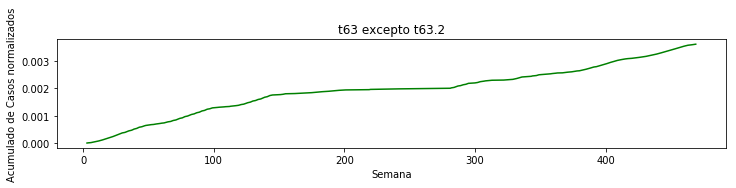

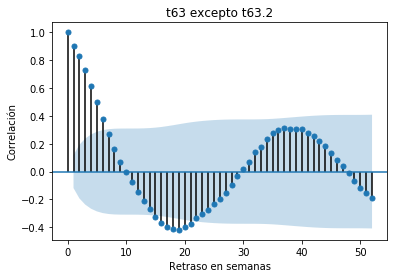

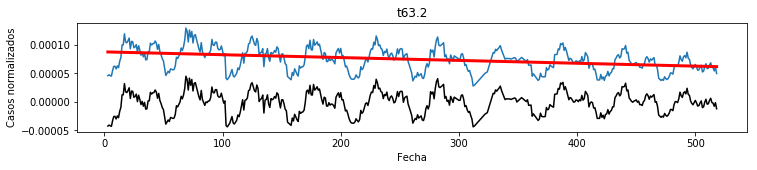

Es estacionaria


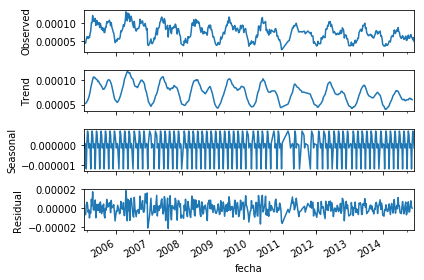

y = f(x) = -5.001283641779608e-08 x + 8.79623291848092e-05
error 5.714736801137942e-09
p =  3.9731738436330694e-17
pendiente significativa
R^2 0.14220420601744926


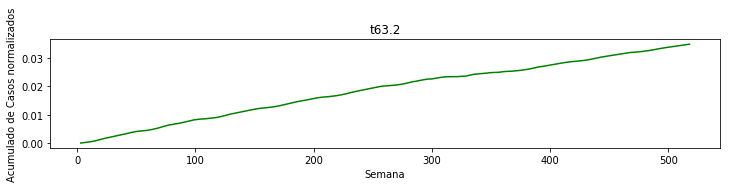

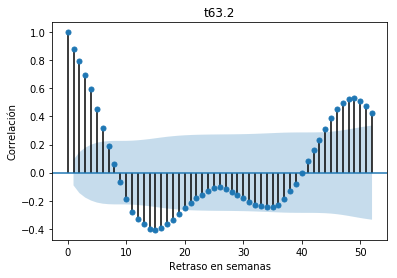

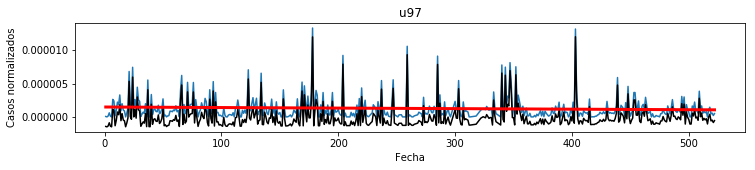

Es estacionaria


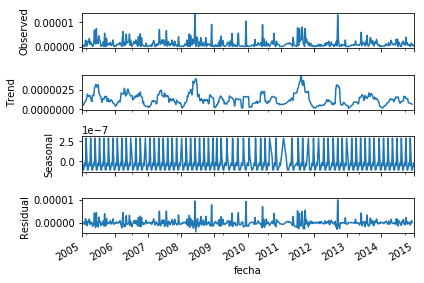

y = f(x) = -8.130421944150187e-10 x + 1.4827816461880552e-06
error 5.134961166576469e-10
p =  0.11399979312553642
pendiente no significativa
R^2 0.005185003922499099


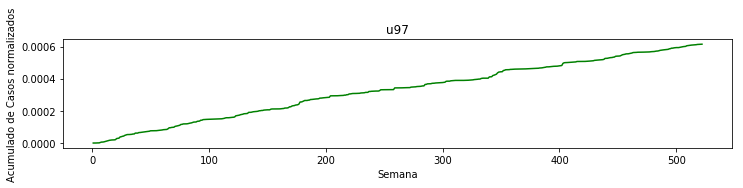

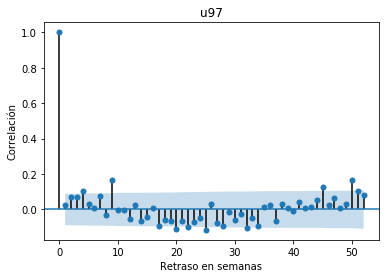

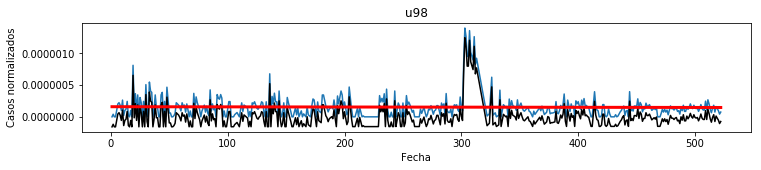

Es estacionaria


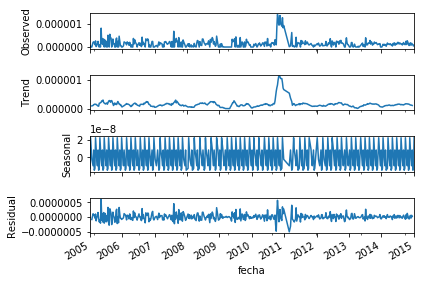

y = f(x) = -2.343881502957884e-11 x + 1.5962437413039917e-07
error 5.6283377413715756e-11
p =  0.6772793134611803
pendiente no significativa
R^2 0.00037523732655554774


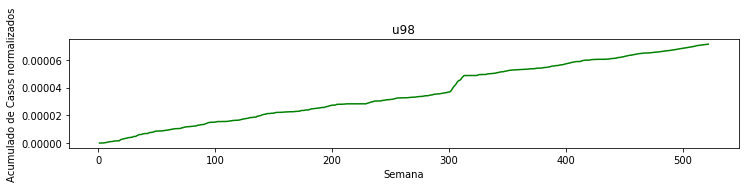

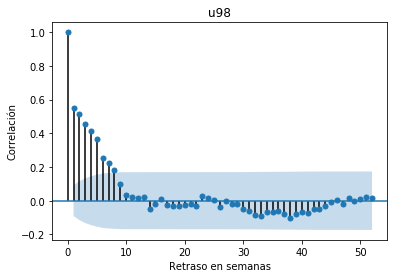

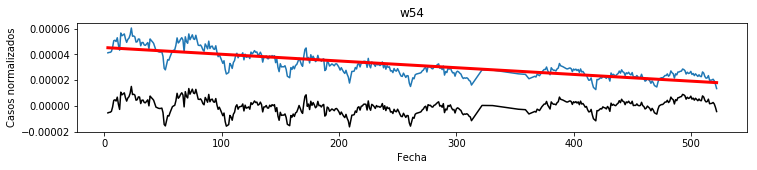

Es estacionaria


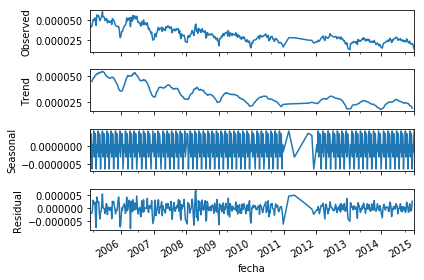

y = f(x) = -5.1932981993184475e-08 x + 4.533358442590547e-05
error 1.6692637054937929e-09
p =  1.6078008523123217e-114
pendiente significativa
R^2 0.6811910446622311


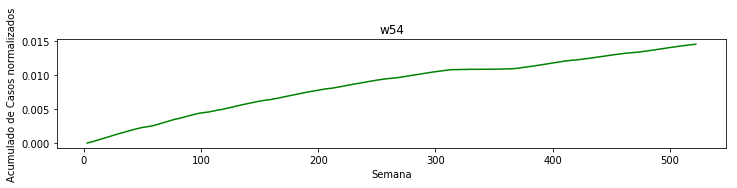

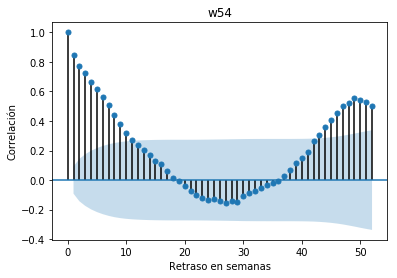

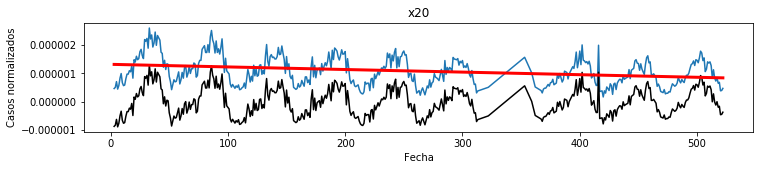

Es estacionaria


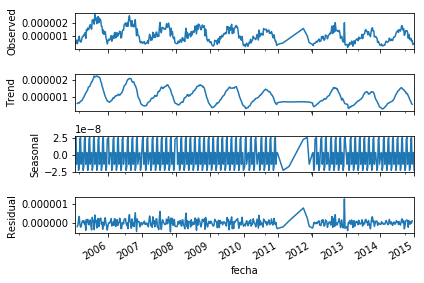

y = f(x) = -9.132331371853941e-10 x + 1.3202325787207294e-06
error 1.4311491048405277e-10
p =  4.359158383428346e-10
pendiente significativa
R^2 0.08264080526994154


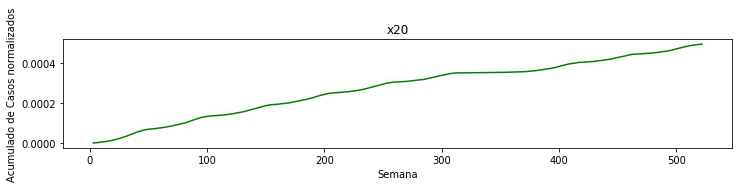

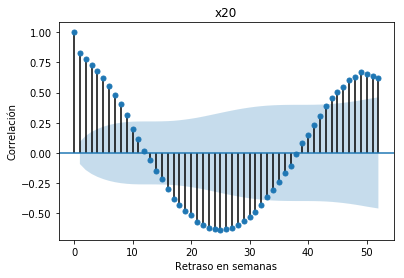

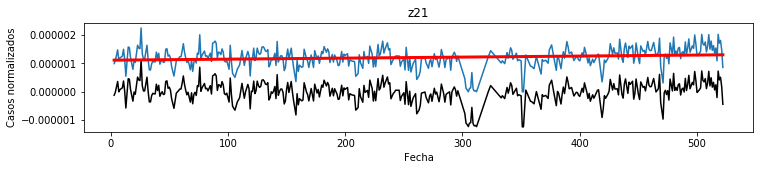

Es estacionaria


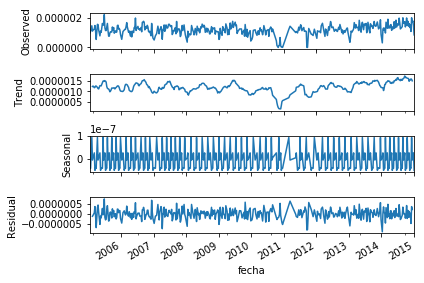

y = f(x) = 3.638834463785147e-10 x + 1.1174278631513553e-06
error 1.1201987356227443e-10
p =  0.0012576398938240337
pendiente significativa
R^2 0.02545396462793614


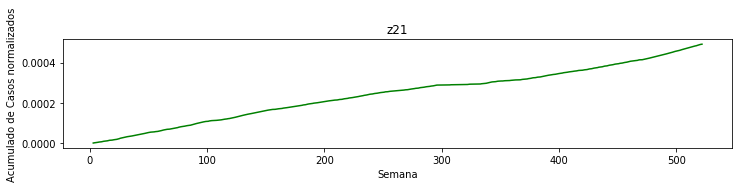

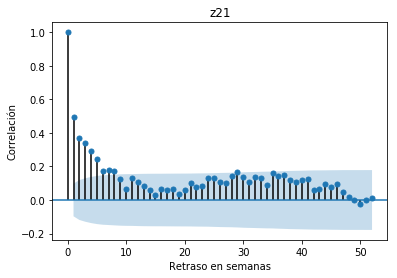

In [71]:
from scipy import signal
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from statsmodels.tsa.stattools import acf

ciesF = [] # CIEs Características
ciesTSt = [] # CIEs Series de tiempo

for name, group in cie:
    
    # https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.detrend.html
    detrended = signal.detrend(group.casos)
    
    a, b, r, p, e = stats.linregress(group['sem'], group.casos)

    plt.figure(figsize=(12, 2))
    plt.plot(group['sem'], group.casos)
    plt.plot(group['sem'], detrended, c='black')
    plt.plot(group['sem'], (a * group['sem'] + b), label = 'y = {:.1f}x + {:.0f}'.format(a, b), color = 'red', linewidth = 3)
    plt.title(name)
    plt.xlabel("Fecha")
    plt.ylabel("Casos normalizados")
    plt.show()
    
    # https://machinelearningmastery.com/decompose-time-series-data-trend-seasonality/
    # Hacer estacionarias: https://www.analyticsvidhya.com/blog/2018/09/non-stationary-time-series-python/ 
    try:
        s = pd.Series(group['casos'], index=pd.DatetimeIndex(group['fecha']))
        sm.tsa.seasonal_decompose(s, freq=7).plot()
    except:
        print(name + ' no se pudo descomponer')
    try:
        # https://machinelearningmastery.com/time-series-data-stationary-python/
        result = sm.tsa.stattools.adfuller(s)
        if(result[1] < 0.5):
            print("Es estacionaria")
        else:
            print("No estacionaria")
    except:
        print(name + ' no se pudo fuller')
    plt.show()
    
    print("y = f(x) = {} x + {}".format(a, b))
    print("error", e)
    print("p = ", p)
    print("pendiente {:s}significativa".format("no " if p >= 0.05 else ""))
    print("R^2", r**2)
    
    # https://stackoverflow.com/questions/48497756/time-series-distance-metric
    plt.figure(figsize=(12, 2))
    # https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.cumsum.html
    plt.plot(group['sem'], group.casos.cumsum(), c='green')
    plt.title(name)
    plt.xlabel("Semana")
    plt.ylabel("Acumulado de Casos normalizados")
    plt.show()
    
    # https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/
    plot_acf(detrended, lags=52)
    # https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.acf.html
    plt.title(name)
    plt.xlabel("Retraso en semanas")
    plt.ylabel('Correlación')
    plt.show()
    
    temp = [a, b]
    # https://stackoverflow.com/a/3748071
    temp.extend(acf(detrended, nlags=52))
    temp.append(name)
    ciesF.append(temp)
    
    temp2 = list(group.casos)
    #temp2.append(name)
    ciesTSt.append(temp2)


y = f(x) = -2.322435607087326e-07 x + 0.00018642953885186607
error 2.4580691385693542e-08
p =  4.218937639925118e-21
pendiente significativa
R^2 0.008834750473414048


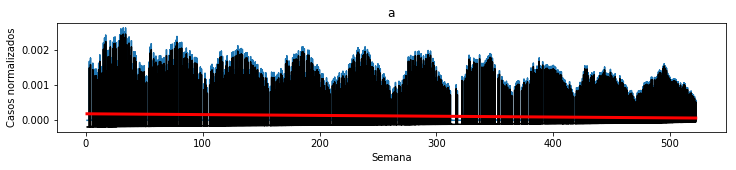

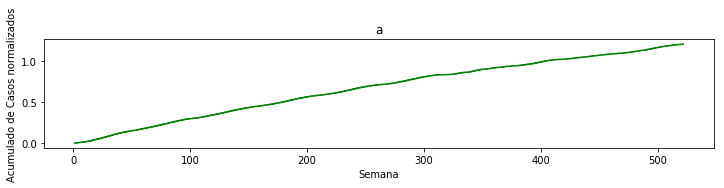

<Figure size 432x288 with 0 Axes>

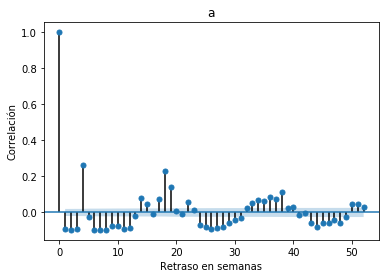

y = f(x) = -1.950302679486766e-08 x + 2.1003475197080275e-05
error 2.9914826904487073e-09
p =  7.747452841909533e-11
pendiente significativa
R^2 0.008415817644051377


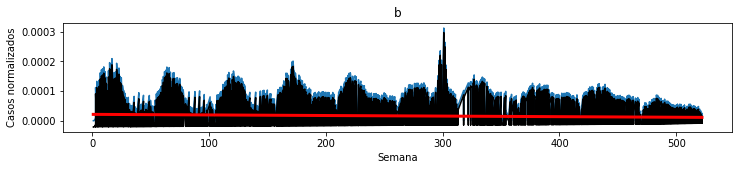

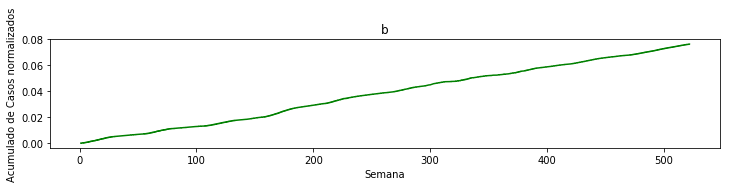

<Figure size 432x288 with 0 Axes>

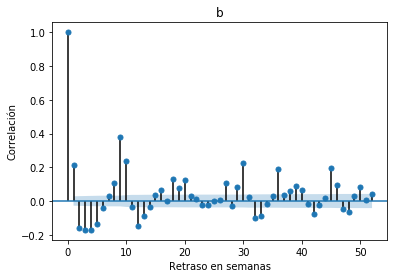

y = f(x) = -7.687412126573936e-08 x + 6.301895314999715e-05
error 1.1457310486128478e-07
p =  0.502673046638322
pendiente no significativa
R^2 0.0012420716051614587


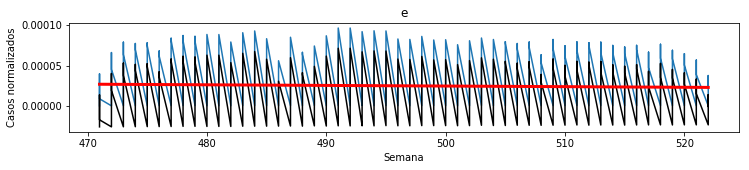

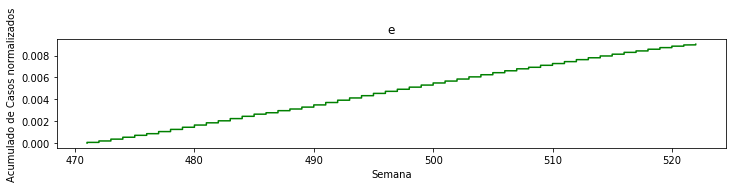

<Figure size 432x288 with 0 Axes>

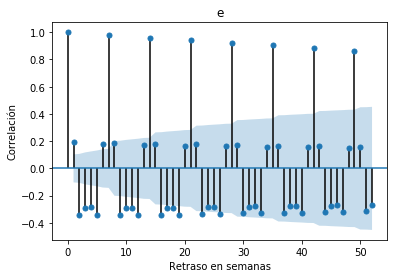

y = f(x) = 4.3246266712998336e-10 x + 2.0494134297225306e-07
error 7.239655510808933e-11
p =  4.188779079116415e-09
pendiente significativa
R^2 0.06134442012808598


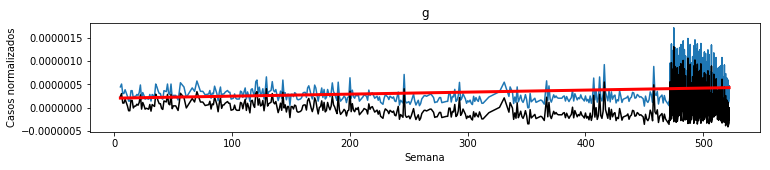

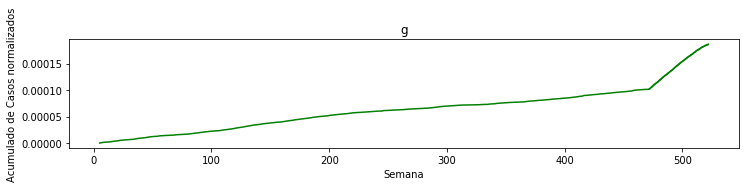

<Figure size 432x288 with 0 Axes>

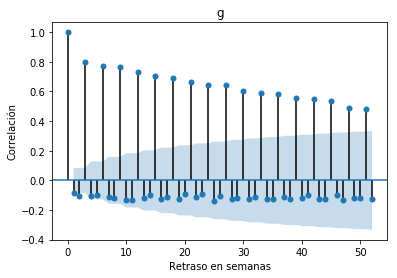

y = f(x) = 6.114012516943934e-08 x + -9.370219482048826e-06
error 5.454249521195378e-09
p =  7.943541732518411e-27
pendiente significativa
R^2 0.15932910794855193


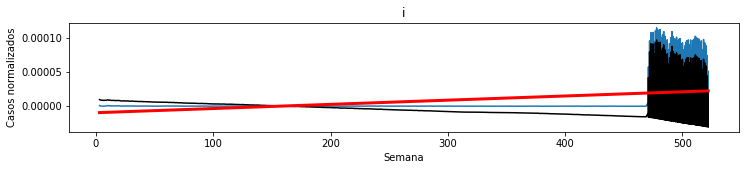

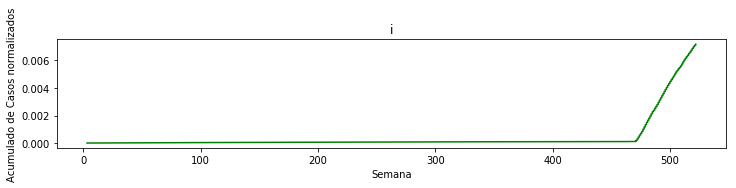

<Figure size 432x288 with 0 Axes>

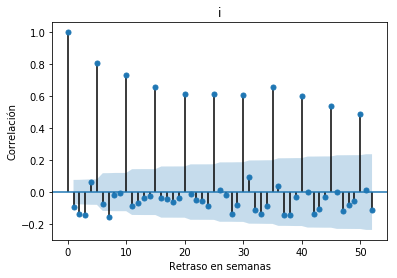

y = f(x) = -5.476287630463039e-06 x + 0.004047543918036932
error 6.313606290646646e-07
p =  1.289138576808768e-17
pendiente significativa
R^2 0.05720240508379613


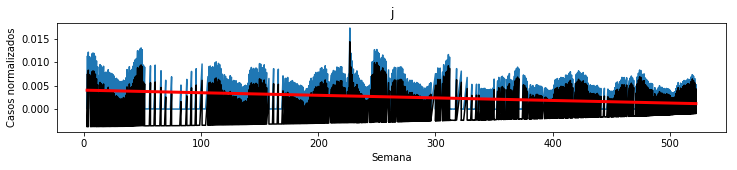

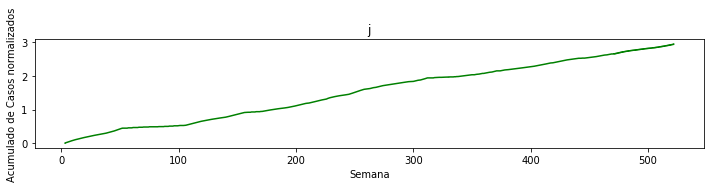

<Figure size 432x288 with 0 Axes>

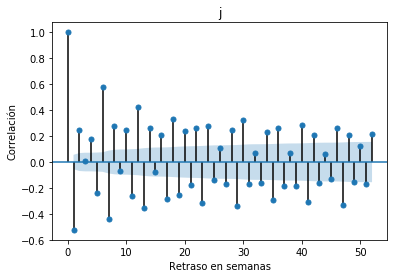

y = f(x) = 3.0607452607643746e-14 x + 8.632235917582137e-10
error 1.0811257202089338e-12
p =  0.9774272215311792
pendiente no significativa
R^2 1.8298987789070766e-06


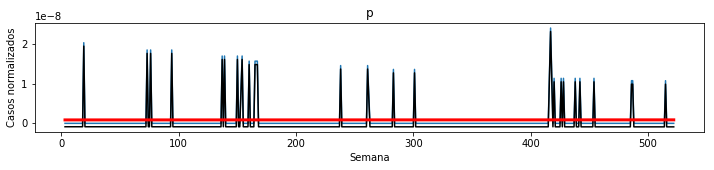

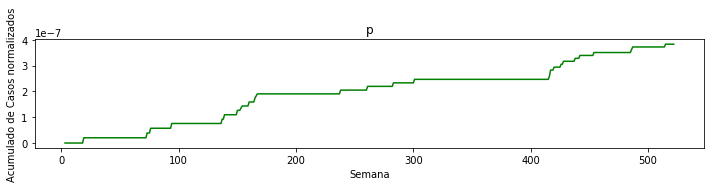

<Figure size 432x288 with 0 Axes>

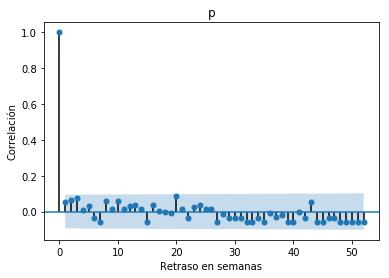

y = f(x) = -4.552145867367466e-08 x + 4.150055938885171e-05
error 5.280393877158448e-09
p =  1.7027198403366345e-17
pendiente significativa
R^2 0.04850098103773122


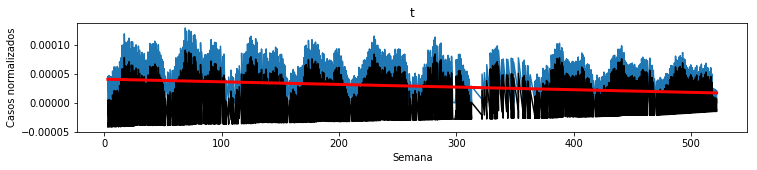

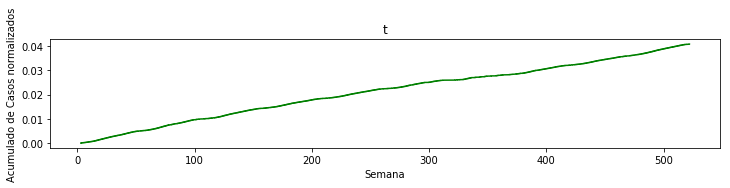

<Figure size 432x288 with 0 Axes>

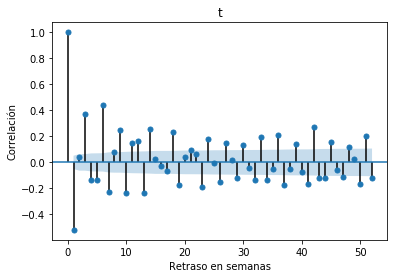

y = f(x) = -5.49698123499916e-10 x + 8.572895488021165e-07
error 2.657552949170124e-10
p =  0.03885630945712471
pendiente significativa
R^2 0.00427296952109651


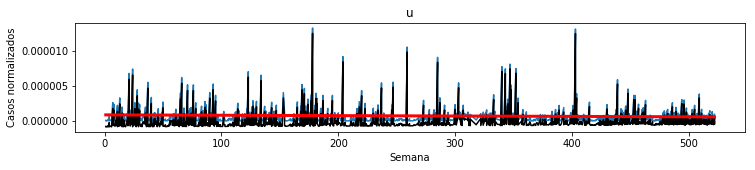

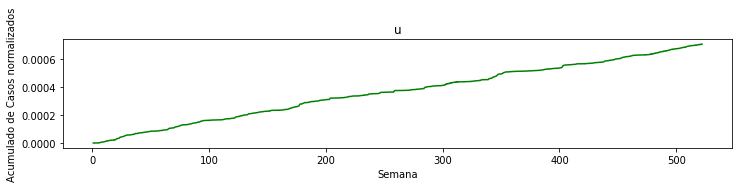

<Figure size 432x288 with 0 Axes>

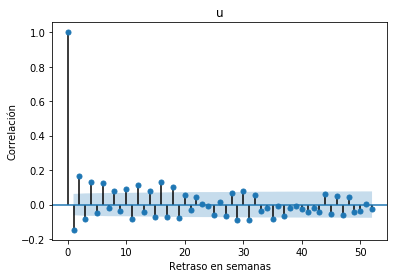

y = f(x) = -3.113838566200732e-08 x + 3.0350821580836586e-05
error 3.4613396780786325e-09
p =  2.3139213313647085e-18
pendiente significativa
R^2 0.10649538120403677


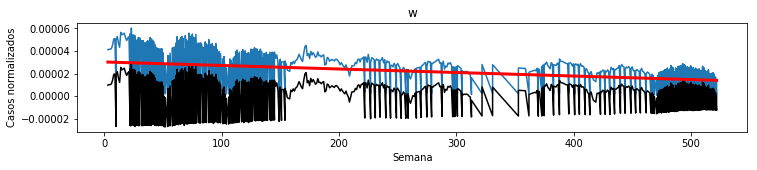

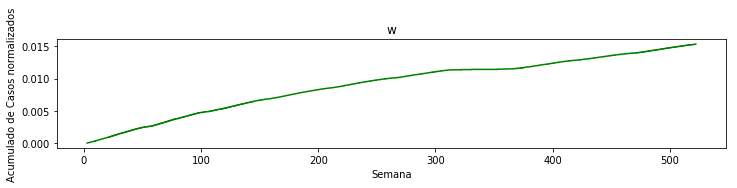

<Figure size 432x288 with 0 Axes>

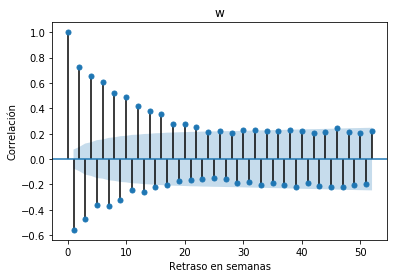

y = f(x) = -9.132331371853941e-10 x + 1.3202325787207294e-06
error 1.4311491048405277e-10
p =  4.359158383428346e-10
pendiente significativa
R^2 0.08264080526994154


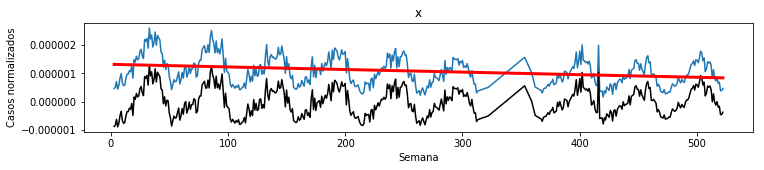

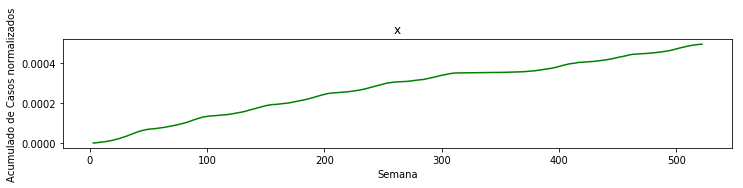

<Figure size 432x288 with 0 Axes>

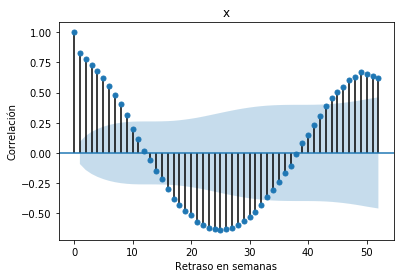

y = f(x) = 3.638834463785147e-10 x + 1.1174278631513553e-06
error 1.1201987356227443e-10
p =  0.0012576398938240337
pendiente significativa
R^2 0.02545396462793614


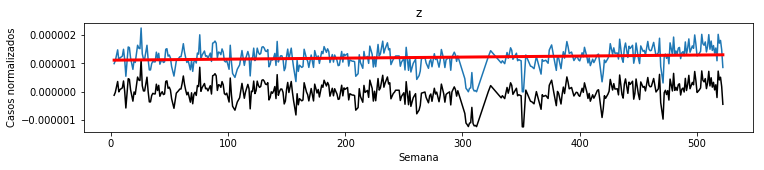

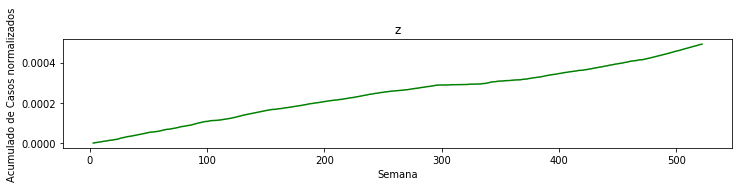

<Figure size 432x288 with 0 Axes>

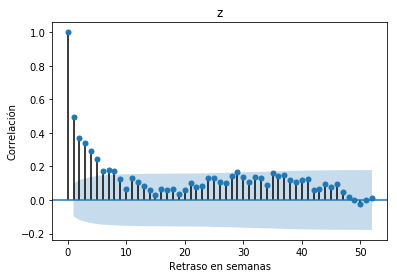

In [72]:
for name, group in cieG:
    
    # https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.detrend.html
    detrended = signal.detrend(group.casos)
    
    a, b, r, p, e = stats.linregress(group['sem'], group.casos)
    print("y = f(x) = {} x + {}".format(a, b))
    print("error", e)
    print("p = ", p)
    print("pendiente {:s}significativa".format("no " if p >= 0.05 else ""))
    print("R^2", r**2)
    plt.figure(figsize=(12, 2))
    plt.plot(group['sem'], group.casos)
    plt.plot(group['sem'], detrended, c='black')
    plt.plot(group['sem'], (a * group['sem'] + b), label = 'y = {:.1f}x + {:.0f}'.format(a, b), color = 'red', linewidth = 3)
    plt.title(name)
    plt.xlabel("Semana")
    plt.ylabel("Casos normalizados")
    plt.show()
    
    # https://stackoverflow.com/questions/48497756/time-series-distance-metric
    plt.figure(figsize=(12, 2))
    # https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.cumsum.html
    plt.plot(group['sem'], group.casos.cumsum(), c='green')
    plt.title(name)
    plt.xlabel("Semana")
    plt.ylabel("Acumulado de Casos normalizados")
    plt.show()
    
    plt.figure()
    # https://machinelearningmastery.com/gentle-introduction-autocorrelation-partial-autocorrelation/
    plot_acf(detrended, lags=52)
    # https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.acf.html
    plt.title(name)
    plt.xlabel("Retraso en semanas")
    plt.ylabel('Correlación')
    plt.show()

Se extraen las características de cada CIE en tanto serie de tiempo. A saber, su pendiente, ordenada en el origen y las autocorrelaciones con retraso de 1 a 52 semanas (eliminando el retraso de 0 semanas)

In [73]:
ciesF = pd.DataFrame(ciesF)

# https://stackoverflow.com/a/11346337
colNames = ['m', 'b']
for i in range (53):
    colNames.append('ac' + str(i))
colNames.append('cie')
ciesF.columns = colNames

ciesF = ciesF.drop(['ac0'], axis=1)

ciesF.sort_values(by=['m'], ascending=False)

,m,b,ac1,ac2,ac3,ac4,ac5,ac6,ac7,ac8,...,ac44,ac45,ac46,ac47,ac48,ac49,ac50,ac51,ac52,cie
39,3.638834e-10,1.117428e-06,0.497210,0.371337,0.338770,0.295026,0.246889,0.170797,0.177532,0.174927,...,0.095734,0.079953,0.094433,0.045073,0.020609,0.002565,-0.025604,0.001100,0.014393,z21
11,2.725401e-10,1.947195e-08,0.089659,-0.019229,-0.025867,-0.002608,-0.028985,-0.001130,-0.058919,-0.019433,...,-0.034949,-0.062431,-0.002219,0.029734,0.005434,-0.050439,0.078625,0.029168,-0.002898,a37
21,4.306189e-11,4.531178e-07,0.299805,0.225857,0.068495,0.057942,0.001655,0.017533,0.033656,0.100137,...,0.050684,0.016318,0.061034,0.053793,0.021663,0.059753,-0.005982,0.033164,-0.047455,b17.1
0,4.268750e-11,-5.612765e-09,0.393749,0.122484,0.010328,0.026661,0.015698,0.021141,-0.002905,-0.010120,...,-0.017536,-0.017607,-0.017679,-0.017751,-0.017822,-0.017893,-0.017965,-0.018036,-0.018107,a00
8,3.893878e-11,4.432440e-08,0.393243,0.260146,0.044702,0.032172,0.012605,0.025166,0.014480,0.009281,...,-0.017366,0.067969,0.005142,0.003701,-0.020010,0.007456,0.042142,0.077540,0.090818,a27
9,2.343471e-13,-3.600315e-11,-0.007522,-0.007561,-0.007600,-0.007639,-0.007678,-0.007717,-0.007756,-0.007795,...,-0.000592,-0.000605,-0.000618,-0.000631,-0.000644,-0.000657,-0.000670,-0.000683,-0.000696,a33
31,3.060745e-14,8.632236e-10,0.055952,0.062823,0.076371,0.006623,0.030863,-0.037294,-0.060305,0.059805,...,-0.057127,-0.057262,-0.035717,-0.035852,-0.057666,-0.057801,-0.057936,-0.058070,-0.058205,p35.0
16,0.000000e+00,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a92.3
25,-1.067385e-11,4.355251e-09,0.077117,0.322187,0.046591,0.036037,-0.023600,0.020128,-0.018800,-0.026529,...,-0.023442,0.017590,-0.018073,-0.018183,-0.023882,0.032515,-0.001876,0.011733,0.004771,b50
6,-1.462773e-11,4.515318e-08,0.085993,0.048897,0.064574,0.118768,-0.023565,-0.026439,0.023959,-0.036252,...,0.064103,0.019108,-0.021642,-0.019077,0.015544,0.031099,-0.056185,-0.073401,-0.004459,a17.0


In [74]:
ciesF = ciesF.dropna()
print(ciesF)

               m             b       ac1       ac2       ac3       ac4  \
0   4.268750e-11 -5.612765e-09  0.393749  0.122484  0.010328  0.026661   
1  -1.765308e-06  1.975491e-03  0.831565  0.690654  0.594390  0.516446   
2  -3.075234e-09  1.290497e-05  0.667701  0.505751  0.436771  0.352219   
3  -1.078567e-08  6.155839e-06  0.620012  0.595386  0.535631  0.462663   
4  -9.213574e-09  1.295795e-05  0.605797  0.479571  0.410353  0.367218   
5  -3.831012e-09  4.559111e-06  0.380632  0.195406  0.107774  0.091505   
6  -1.462773e-11  4.515318e-08  0.085993  0.048897  0.064574  0.118768   
7  -1.764268e-10  6.894953e-07  0.522652  0.363609  0.361372  0.385651   
8   3.893878e-11  4.432440e-08  0.393243  0.260146  0.044702  0.032172   
9   2.343471e-13 -3.600315e-11 -0.007522 -0.007561 -0.007600 -0.007639   
10 -3.423410e-11  1.862211e-08 -0.081445  0.057375 -0.049496  0.012841   
11  2.725401e-10  1.947195e-08  0.089659 -0.019229 -0.025867 -0.002608   
12 -4.255464e-09  2.747090e-06  0.1405

In [75]:
ciesF.to_csv('features.csv', index = None, header=True)

Se agrupan las CIEs por casos dados en una semana, como series de tiempo.

In [76]:
ciesTS = pd.DataFrame(ciesTSt)
t = list(cie.groups.keys())
ciesTS['cie'] = t

ciesTS

,0,1,2,3,4,5,6,7,8,9,...,499,500,501,502,503,504,505,506,507,cie
0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a00
1,1.680513e-03,1.775734e-03,1.627001e-03,1.625660e-03,1.864860e-03,1.309199e-03,2.207610e-03,2.350106e-03,2.430496e-03,1.990453e-03,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a01-a03
2,9.589117e-06,9.467222e-06,8.857744e-06,8.654585e-06,9.182799e-06,8.593637e-06,9.548485e-06,1.204734e-05,9.101535e-06,1.025954e-05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a01.0
3,5.404036e-06,5.058666e-06,6.683940e-06,4.002238e-06,5.790039e-06,5.688459e-06,6.013514e-06,6.663624e-06,5.464984e-06,4.977402e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a03
4,1.310377e-05,1.210829e-05,9.304694e-06,1.107218e-05,1.241303e-05,1.338820e-05,9.792277e-06,1.127534e-05,9.954804e-06,1.294125e-05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a05
5,3.331812e-06,4.449188e-06,4.510136e-06,4.002238e-06,6.054146e-06,4.733611e-06,4.916454e-06,4.246029e-06,4.571083e-06,3.555287e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a15-a16
6,2.031593e-08,4.063185e-08,1.015796e-07,2.031593e-08,0.000000e+00,2.031593e-08,8.126371e-08,6.094778e-08,8.126371e-08,1.015796e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a17.0
7,5.688459e-07,9.345326e-07,7.923211e-07,6.297937e-07,7.313734e-07,9.142167e-07,9.345326e-07,6.704256e-07,7.516893e-07,8.126371e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a23
8,0.000000e+00,2.031593e-08,0.000000e+00,2.031593e-08,2.031593e-08,0.000000e+00,2.031593e-08,0.000000e+00,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a27
9,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,a33


# Estadística descriptiva

## Por CIE general

Se agrupan los datos por grupo más general de la CIE

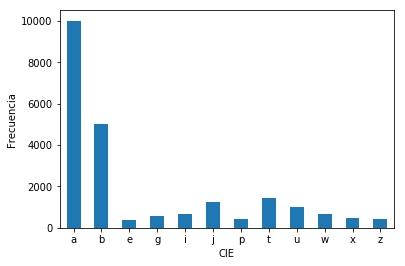

In [77]:
# https://stackoverflow.com/a/45775547

plt.figure()
cieG.size().plot(kind='bar')
plt.xlabel('CIE')
plt.ylabel('Frecuencia')
# https://stackoverflow.com/a/11269325
plt.xticks(rotation=0)
plt.show()

Y se muestra la presencia de cada CIE general

In [78]:
cieG.anio.count() / len(df)

cie
a    0.424144
b    0.212135
e    0.015413
g    0.023204
i    0.028158
j    0.052589
p    0.018631
t    0.061820
u    0.042300
w    0.028835
x    0.019223
z    0.017191
Name: anio, dtype: float64

De donde se ve que las enfermedades del grupo A y B ocupan entre ambas un 64% de los registros. Además, se tiene por cada CIE general

In [79]:
cieG.casos.describe()

,count,mean,std,min,25%,50%,75%,max
cie,,,,,,,,
a,10017.0,1.202777e-04,4.025777e-04,0.000000e+00,0.000000e+00,3.785038e-07,4.566486e-06,2.635219e-03
b,5010.0,1.520223e-05,3.503434e-05,0.000000e+00,6.312829e-08,5.104324e-07,4.003895e-06,3.128519e-04
e,364.0,2.485095e-05,3.278209e-05,5.374737e-08,7.417137e-07,3.171095e-06,5.858732e-05,9.645503e-05
g,548.0,3.400110e-07,2.854271e-07,0.000000e+00,1.762206e-07,2.544228e-07,3.721788e-07,1.709166e-06
i,665.0,1.080299e-05,2.585106e-05,2.149895e-08,2.035382e-07,3.001442e-07,8.148101e-06,1.143959e-04
j,1242.0,2.368700e-03,3.495129e-03,0.000000e+00,2.410763e-05,4.579778e-05,5.315415e-03,1.724190e-02
p,440.0,8.710402e-10,3.579345e-09,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.401154e-08
t,1460.0,2.795942e-05,3.475133e-05,0.000000e+00,8.106173e-07,1.033342e-05,5.777759e-05,1.298213e-04
u,999.0,7.076660e-07,1.345972e-06,0.000000e+00,7.524631e-08,2.161038e-07,7.795753e-07,1.331782e-05


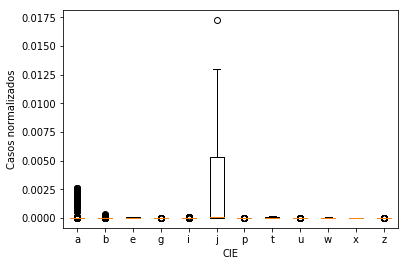

In [80]:
boxes = []
plt.figure()
for name, group in cieG:
    # https://stackoverflow.com/a/27422749
    boxes.append(group.casos)
    #boxes.append(np.log(cie[1][cie[1]['casos'] > 0]['casos']))
plt.boxplot(boxes)
# https://stackoverflow.com/a/27440179
plt.xlabel('CIE')
plt.ylabel('Casos normalizados')
# https://matplotlib.org/examples/ticks_and_spines/ticklabels_demo_rotation.html
plt.xticks(range(1, len(cieG) + 1), cieG.groups.keys())
plt.show()

Para mejorar la visualización de esta gráfica, se muestran en escala logarítmica los casos normalizados

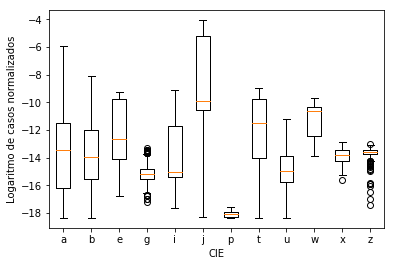

In [81]:
boxes = []
plt.figure()
for name, group in cieG:
    # https://stackoverflow.com/a/27422749
    boxes.append(np.log(group[group.casos > 0].casos))
    #boxes.append(np.log(cie[1][cie[1]['casos'] > 0]['casos']))
plt.boxplot(boxes)
# https://stackoverflow.com/a/27440179
plt.xlabel('CIE')
plt.ylabel('Logaritmo de casos normalizados')
plt.xticks(range(1, len(cieG) + 1), cieG.groups.keys())
plt.show()

## Por año

Se muestra primero la frecuencia de registros por año

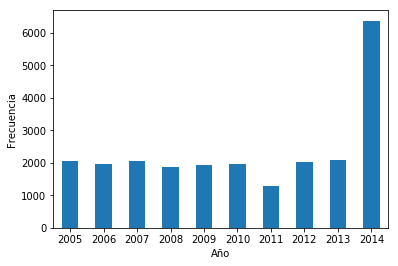

In [82]:
anio = df.groupby('anio')

plt.figure()
anio.size().plot(kind='bar')
plt.xlabel('Año')
plt.ylabel('Frecuencia')
# https://stackoverflow.com/a/11269325
plt.xticks(rotation=0)
plt.show()

y su porcentaje

In [83]:
anio.anio.count() / len(df)

anio
2005    0.087691
2006    0.082737
2007    0.087098
2008    0.079773
2009    0.081805
2010    0.083457
2011    0.054114
2012    0.085362
2013    0.088072
2014    0.269890
Name: anio, dtype: float64

In [84]:
anio.casos.describe()

,count,mean,std,min,25%,50%,75%,max
anio,,,,,,,,
2005,2071.0,0.000300,0.001452,0.0,6.094778e-08,9.345326e-07,0.000010,0.013016
2006,1954.0,0.000124,0.000658,0.0,3.697560e-08,8.134632e-07,0.000008,0.009598
2007,2057.0,0.000263,0.001225,0.0,3.392304e-08,8.480759e-07,0.000009,0.010062
2008,1884.0,0.000225,0.001015,0.0,3.133605e-08,6.893932e-07,0.000012,0.009232
2009,1932.0,0.000297,0.001437,0.0,2.911568e-08,6.987763e-07,0.000011,0.017242
2010,1971.0,0.000232,0.001135,0.0,2.718914e-08,5.709720e-07,0.000008,0.011610
2011,1278.0,0.000210,0.000917,0.0,3.825261e-08,7.905539e-07,0.000010,0.008627
2012,2016.0,0.000191,0.000939,0.0,3.601731e-08,6.483115e-07,0.000006,0.008941
2013,2080.0,0.000171,0.000887,0.0,4.537177e-08,5.784900e-07,0.000005,0.008152


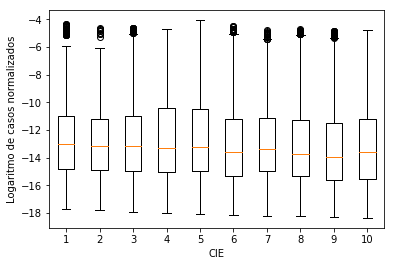

In [85]:
boxes = []
plt.figure()
for name, group in anio:
    # https://stackoverflow.com/a/27422749
    boxes.append(np.log(group[group.casos > 0].casos))
plt.boxplot(boxes)
# https://stackoverflow.com/a/27440179
plt.xlabel('CIE')
plt.ylabel('Logaritmo de casos normalizados')
# https://matplotlib.org/examples/ticks_and_spines/ticklabels_demo_rotation.html
plt.xticks(range(1, len(anio) + 1), range(1, len(anio) + 2005))
plt.show()

# Pruebas estadísticas

## Pruebas de normalidad

### Por casos de CIEs generales

El histograma de casos registrados muestra

In [96]:
#https://stackoverflow.com/a/49207722
cieG_copy = cieG.apply(lambda x: x) 

fig, ax = plt.subplots()
plt.hist(cieG_copy.casos)
plt.xlabel('Casos normalizados')
plt.ylabel('Logaritmo de la frecuencia')
# https://stackoverflow.com/a/21033789
ax.set_yscale('log')
plt.show()

ValueError: cannot reindex from a duplicate axis

mientras que el gráfico Q-Q

In [97]:
from statsmodels.graphics.gofplots import qqplot

qqplot(cieG_copy.casos, line='s')
plt.ylabel("Cuantiles de la muestra")
plt.xlabel("Cuantiles teóricos")
plt.show()

NameError: name 'cieG_copy' is not defined

A partir de estas observaciones, se puede intuir que los casos registrados normalizados no siguen una distribución normal. Se prueba con el logaritmo de los casos registrados para lo cual se igualan los casos que son cero a la décima parte del mínimo de los valores mayores a cero. 

In [98]:
# https://stackoverflow.com/a/48028944
min_nonzero = np.min(cieG_copy[cieG_copy.casos > 0].casos)
cieG_copy.loc[cieG_copy.casos == 0, 'casos'] = min_nonzero / 10

NameError: name 'cieG_copy' is not defined

Luego, al utilizar el logaritmo de los casos se obtiene

In [99]:
qqplot(np.log(cieG_copy.casos), line='s')
plt.ylabel("Cuantiles de la muestra")
plt.xlabel("Cuantiles teóricos")
plt.show()

NameError: name 'cieG_copy' is not defined

El logaritmo de los casos muestra un mejor ajuste, por lo que se le puede realizar de $K^2$ de D'Agostino para saber si la distribución de los datos es gaussiana

In [100]:
from scipy.stats import normaltest
stat, p = normaltest(np.log(cieG_copy.casos))
print('Estadístico = %.3f, p = %.3f' % (stat, p))
# interpret
alpha = 0.05
if p > alpha:
    print('La muestra parece normal con nivel de significancia 0.05')
else:
    print('La muestra no parece normal con nivel de significancia 0.05')

NameError: name 'cieG_copy' is not defined

### Por características de CIEs generales

Se separan en $x$ y $y$ y se normalizan las características

In [101]:
ciesF.dropna()
features = ciesF.iloc[:, 0:54]
y = ciesF.cie

In [102]:
# https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html
from sklearn.preprocessing import MinMaxScaler
x = MinMaxScaler().fit(features).transform(features)

ModuleNotFoundError: No module named 'sklearn'

Se ven sus histogramas y Q-Q

In [ ]:
for col in features:
    temp = features[col]
    
    qqplot(temp, line='s')
    plt.ylabel("Cuantiles de la muestra")
    plt.xlabel(col + " - Cuantiles teóricos")
    plt.show()
    
    stat, p = normaltest(temp)
    print('Estadístico = %.3f, p = %.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        print('La muestra parece normal con nivel de significancia 0.05')
    else:
        print('La muestra no parece normal con nivel de significancia 0.05')

## Pruebas no paramétricas

A partir de la prueba de Wilcoxon se determina qué características pertenecen a distintas distribuciones respecto a las CIEs generales

In [ ]:
from scipy.stats import wilcoxon

def Wilcoxon(x1, x2, name):
    stat, p = wilcoxon(x1, x2)
    print(col + ' - Estadístico = %.3f, p = %.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        print('**Misma distribución**')
    else:
        print('Distinta distribución')
    print('\n')

for col in features:
    Wilcoxon(features[col], y.astype("category").cat.codes, col)

Como todas las características tienen significancia estadística, se procederá a realizar una selección de características.

# Selección de características

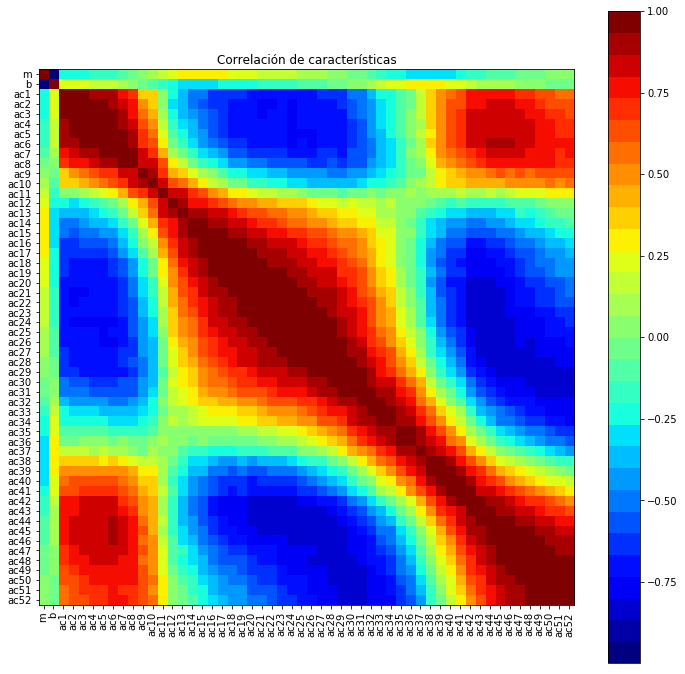

In [38]:
from matplotlib import pyplot as plt
from matplotlib import cm as cm

# https://datascience.stackexchange.com/a/10461
fig = plt.figure(figsize = (12, 12))
ax1 = fig.add_subplot(111)
cmap = cm.get_cmap('jet', 30)
cax = ax1.imshow(features.corr(), interpolation="nearest", cmap=cmap)
plt.title('Correlación de características')
# Add colorbar, make sure to specify tick locations to match desired ticklabels
fig.colorbar(cax)
plt.xticks(range(54), list(features), rotation=90)
plt.yticks(range(54), list(features))
plt.show()

Y se revisan sus relaciones lineales por F-test y no lineales por Información mutua

C:\Users\bena8\AppData\Local\Programs\Python\Python37-32\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by the scale function.
  warnings.warn(msg, DataConversionWarning)


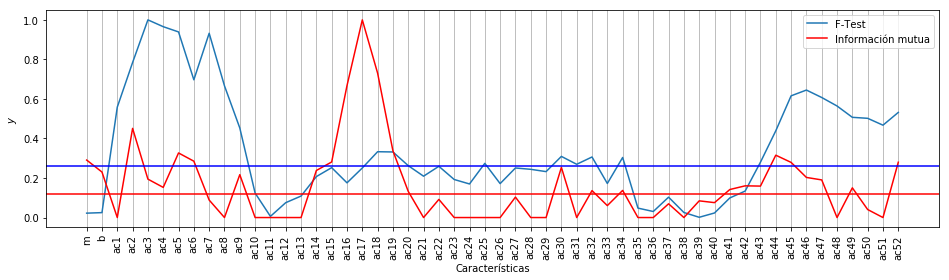

In [39]:
# https://towardsdatascience.com/why-how-and-when-to-apply-feature-selection-e9c69adfabf2
# https://scikit-learn.org/stable/auto_examples/feature_selection/plot_f_test_vs_mi.html#sphx-glr-auto-examples-feature-selection-plot-f-test-vs-mi-py

from sklearn.feature_selection import f_regression, mutual_info_regression

# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.factorize.html
yFactors, yNames = pd.factorize(y.str[0]) 

#ciesF.cie.astype("category").cat.codes
f_test, pF = f_regression(x, yFactors)
where_are_NaNs = np.isnan(f_test)
# https://stackoverflow.com/a/5124409
f_test[where_are_NaNs] = 0.0
f_test /= np.max(f_test)
xF = features.iloc[:, (f_test > np.median(f_test))]

mi = mutual_info_regression(x, yFactors)
mi /= np.max(mi)
xMI = features.iloc[:, (mi > np.median(mi))]

plt.figure(figsize=(16,4))
plt.plot(f_test)
plt.ylabel("$y$")
plt.xlabel("Características")
plt.xticks(range(54), list(features), rotation=90)
plt.plot(mi, c="red")
plt.axhline(y=np.median(f_test), c = 'blue')
plt.axhline(y=np.median(mi), c = 'red')
# https://matplotlib.org/gallery/lines_bars_and_markers/bar_stacked.html#sphx-glr-gallery-lines-bars-and-markers-bar-stacked-py
plt.legend(('F-Test', 'Información mutua'))
# https://stackoverflow.com/a/25799781
plt.gca().xaxis.grid(True)
plt.show()

Además se hace una selección de características por umbral de varianza

Umbral de varianza = 0.08999999999999998


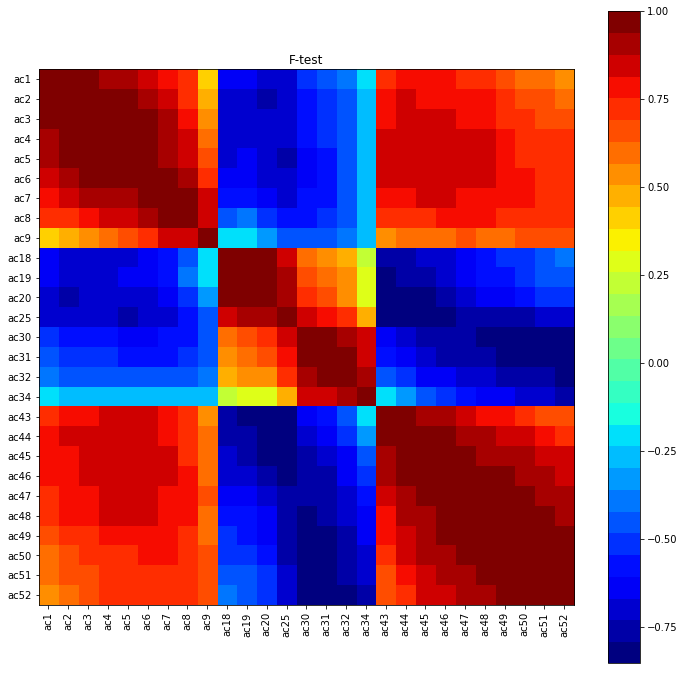

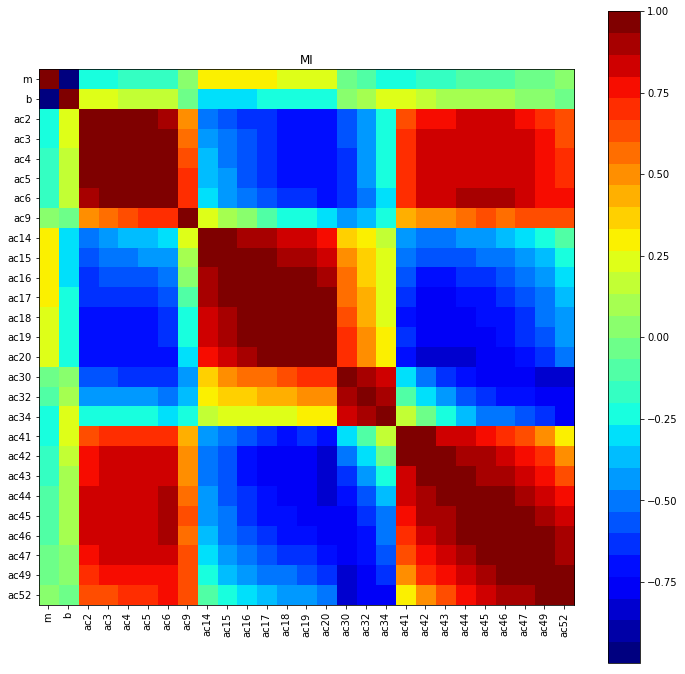

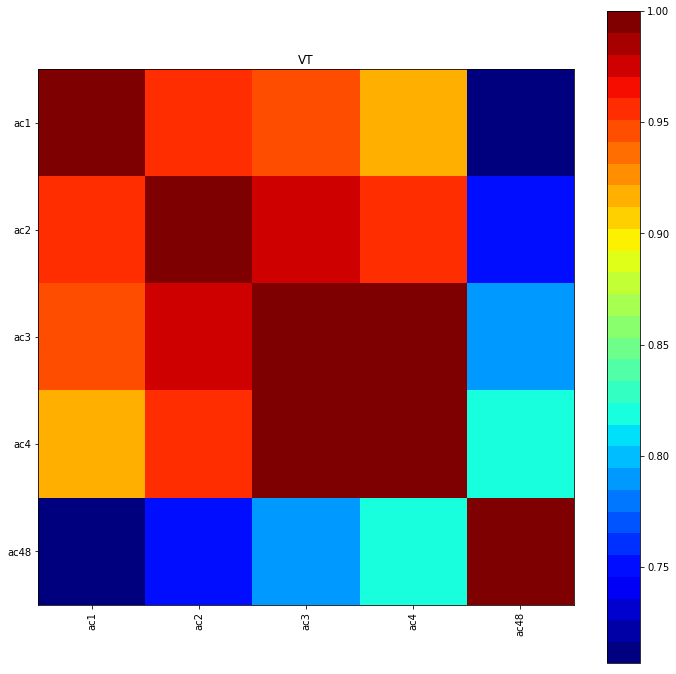

In [40]:
# https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.VarianceThreshold.html#sklearn.feature_selection.VarianceThreshold
from sklearn.feature_selection import VarianceThreshold
th = .9 * (1 - .9)
print("Umbral de varianza = {}".format(th))
sel = VarianceThreshold(threshold = th)

sel.fit_transform( x )

# https://stackoverflow.com/q/39812885
fig = plt.figure(figsize = (12, 12))
ax1 = fig.add_subplot(111)
cmap = cm.get_cmap('jet', 30)
cax = ax1.imshow(xF.corr(), interpolation="nearest", cmap=cmap)
plt.title('F-test')
# Add colorbar, make sure to specify tick locations to match desired ticklabels
fig.colorbar(cax)
# https://stackoverflow.com/a/19483025
plt.xticks(range(len(list(xF))), list(xF), rotation=90)
plt.yticks(range(len(list(xF))), list(xF))
plt.show()

fig = plt.figure(figsize = (12, 12))
ax1 = fig.add_subplot(111)
cmap = cm.get_cmap('jet', 30)
cax = ax1.imshow(xMI.corr(), interpolation="nearest", cmap=cmap)
plt.title('MI')
# Add colorbar, make sure to specify tick locations to match desired ticklabels
fig.colorbar(cax)
# https://stackoverflow.com/a/19483025
plt.xticks(range(len(list(xMI))), list(xMI), rotation=90)
plt.yticks(range(len(list(xMI))), list(xMI))
plt.show()

xVT = features[features.columns[sel.get_support(indices=True)]]
fig = plt.figure(figsize = (12, 12))
ax1 = fig.add_subplot(111)
cmap = cm.get_cmap('jet', 30)
cax = ax1.imshow(xVT.corr(), interpolation="nearest", cmap=cmap)
plt.title('VT')
# Add colorbar, make sure to specify tick locations to match desired ticklabels
fig.colorbar(cax)
# https://stackoverflow.com/a/19483025
plt.xticks(range(len(list(xVT))), list(xVT), rotation=90)
plt.yticks(range(len(list(xVT))), list(xVT))
plt.show()

In [41]:
xF.to_csv('xF.csv', index = None, header=True)
xMI.to_csv('xMI.csv', index = None, header=True)
xVT.to_csv('xVT.csv', index = None, header=True)
y.to_csv('y.csv', index = None, header = True)

# Modelo lineal

Se revisará si las características elegidas por F-test siguen un modelo lineal

In [ ]:
from scipy import stats
import matplotlib.cm as cm

for col in xF:
    a, b, r, p, e = stats.linregress(xF[col], yFactors)
    print("y = f(x) = {:.4f} x + {:.4f}".format(a, b))
    print("error", e)
    print("p = ", p)
    print("pendiente {:s}significativa".format("no " if p >= 0.05 else ""))
    print("R^2", r**2)

    plt.plot(xF[col], (a * xF[col] + b), label = 'y = {:.1f}x + {:.0f}'.format(a, b), color = 'red', linewidth = 3)
    plt.scatter(xF[col], yFactors)
    plt.xlabel(col)
    plt.ylabel('CIE')
    plt.show()

Aunque en algunas la pendiente es significativa, el ajuste es malo con respecto a las CIEs generales.

# Regresión múltiple de las características seleccionadas

OLS de las características contra las CIEs

In [ ]:
#import statsmodels.api as sm

# https://stackoverflow.com/a/29763653
xTemp = xF
xTemp = sm.add_constant(xTemp)
m = sm.OLS(yFactors, xTemp).fit() 
print(m.summary())
xTemp = xF
xTemp['cie'] = yFactors

pd.plotting.scatter_matrix(xTemp, figsize = (15, 15), s = 150) 
plt.show()

OLS de las características contra las CIEs generales

In [ ]:
xTemp = None
xTemp = xMI
xTemp = sm.add_constant(xTemp)
m = sm.OLS(yFactors, xTemp).fit() 
print(m.summary())

xTemp = xMI
xTemp['cie'] = yFactors

pd.plotting.scatter_matrix(xTemp, figsize = (15, 15), s = 150) 
plt.show()
# Predicción
# https://www.statsmodels.org/devel/examples/notebooks/generated/ols.html

In [ ]:
xTemp = None
xTemp = xVT
xTemp = sm.add_constant(xTemp)
m = sm.OLS(yFactors, xTemp).fit() 
print(m.summary())

xTemp = xVT
xTemp['cie'] = yFactors

pd.plotting.scatter_matrix(xTemp, figsize = (15, 15), s = 150) 
plt.show()

Los modelos con las características de F-test y MI presentan un ajuste por encima de $0.5$ aunque no sean estadísticamente significativos. Por su parte, el modelo con las características elegidas del umbral de varianza tiene el peor ajuste $R^2 = 0.217$ pero es el más significativo con $p(F) = 0.135$.

# PCA

Ahora se realiza un análisis de componentes principales o PCA por sus siglas en inglés a partir de las características

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

x = features[['casos', 'sem']].values
x = StandardScaler().fit_transform(x)
y = features.loc[:,['cie']].values
k = 2 # dimensiones deseadas
pca = PCA(n_components = k)
cd = pd.DataFrame(data = pca.fit_transform(x), columns = ['pca{:d}'.format(i) for i in range(k)])
cd['cie'] = y
ordenado = pd.DataFrame.sort_values(cd, ['cie'], ascending = False)
cd.sample(3)

In [ ]:
pca.explained_variance_ratio_

Estos componentes principales comparten de manera muy cercana la mitad de la varianza de los datos.

In [ ]:
import matplotlib.cm as cm

plt.figure()
plt.xlabel('Primer componente')
plt.ylabel('Segundo componente')
plt.scatter(cd.pca0, cd.pca1, c = cd.cie, cmap=cm.tab20)

cbar = plt.colorbar()
cbar.ax.get_yaxis().set_ticks([])
for j, lab in enumerate(cieName):
    cbar.ax.text(2, (j + 0.5) / len(cieName), str(j) + ' ' +lab, ha='center', va='center')
cbar.ax.get_yaxis().labelpad = 15
plt.show()

Estos resultados muestran una clara distinción entre las CIE A y J, por lo que podrían apartarse del conjunto y ver cómo se comportan el resto

In [ ]:
features_copy = features

features_copy = features_copy[features_copy['cie'] != 0]
features_copy = features_copy[features_copy['cie'] != 8]

x = features_copy[['casos', 'sem']].values
x = StandardScaler().fit_transform(x)
y = features_copy.loc[:,['cie']].values
k = 2 # dimensiones deseadas
pca = PCA(n_components = k)
cd = pd.DataFrame(data = pca.fit_transform(x), columns = ['pca{:d}'.format(i) for i in range(k)])
cd['cie'] = y
ordenado = pd.DataFrame.sort_values(cd, ['cie'], ascending = False)

plt.figure()
plt.xlabel('Primer componente')
plt.ylabel('Segundo componente')
plt.scatter(cd.pca0, cd.pca1, c = cd.cie, cmap=cm.tab20)

cieName_copy = cieName
cieName_copy.remove('a')
cieName_copy.remove('j')

cbar = plt.colorbar()
cbar.ax.get_yaxis().set_ticks([])
for j, lab in enumerate(cieName_copy):
    cbar.ax.text(2, (j + 0.5) / len(cieName_copy), lab, ha='center', va='center')
cbar.ax.get_yaxis().labelpad = 15
plt.show()

Después de la eliminación, el resto de las CIE parecen seguir patrones impredecibles con base en estas características. En cambio, puede suponerse que entre las A y las J hay una clara distinción y probablemente se puedan obtener mejores modelos si se descartan las demás CIE.

In [ ]:
features_copy = pd.concat([features[features.cie == 0], features[features.cie == 8]])

x = features_copy[['casos', 'sem']].values
x = StandardScaler().fit_transform(x)
y = features_copy.loc[:,['cie']].values
k = 2 # dimensiones deseadas
pca = PCA(n_components = k)
cd = pd.DataFrame(data = pca.fit_transform(x), columns = ['pca{:d}'.format(i) for i in range(k)])
cd['cie'] = y
ordenado = pd.DataFrame.sort_values(cd, ['cie'], ascending = False)

plt.figure()
plt.xlabel('Primer componente')
plt.ylabel('Segundo componente')
plt.scatter(cd.pca0, cd.pca1, c = cd.cie)

cieName_copy = ['a', 'j']

cbar = plt.colorbar()
cbar.ax.get_yaxis().set_ticks([])
for j, lab in enumerate(cieName_copy):
    cbar.ax.text(2, (j), lab, ha='center', va='center')
cbar.ax.get_yaxis().labelpad = 15
plt.show()

In [ ]:
m = ols('cie ~ casos + sem', data = features_copy).fit() 
a = sm.stats.anova_lm(m, typ = 2)
print(a)
n = len(a)
alpha = 0.05
for i in range(n):
    print("{:s} {:s}es significativo".format(a.index[i], "" if a['PR(>F)'][i] < alpha else "no "))

In [ ]:
(1.001768e+06 - 55560.613600) / 1.001768e+06

La suma cuadrada de los residuales se redujo un 94% pero aún así siguen siendo altos, por lo que con estas características parece improbable ajustar un modelo.

# Pronóstico

Una vez eliminada la tendencia se puede comprobar que las series de tiempo para cada enfermedad son estacionales

In [ ]:
from statsmodels.tsa.stattools import adfuller
def test_stationarity(timeseries, w, name):
    
    #Determing rolling statistics
    rolmean = timeseries.rolling(w).mean()
    rolstd = timeseries.rolling(w).std()

    #Plot rolling statistics:
    orig = plt.plot(timeseries,label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title(name)
    plt.show(block=False)
    
    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    
for i in range(len(ciesTS)):
    temp = ciesTS.iloc[i, : 508]
    temp.dropna(inplace=True)
    test_stationarity(temp, 52, ciesTS.iloc[i, -1])

Por ello es posible pronosticarlas con el método de Holt-Winter

In [ ]:
# https://www.analyticsvidhya.com/blog/2018/02/time-series-forecasting-methods/
# https://machinelearningmastery.com/time-series-forecasting-methods-in-python-cheat-sheet/
# https://towardsdatascience.com/time-series-in-python-exponential-smoothing-and-arima-processes-2c67f2a52788

from statsmodels.tsa.api import Holt, SimpleExpSmoothing, ExponentialSmoothing

pronosticos = []
real = []
for i in range(len(ciesTS)):
    temp = ciesTS.iloc[i, : 508]
    temp.dropna(inplace=True)
    
    # https://medium.com/datadriveninvestor/how-to-build-exponential-smoothing-models-using-python-simple-exponential-smoothing-holt-and-da371189e1a1
    # Train = 0.7
    train = round(0.7 * len(temp))
    f = ExponentialSmoothing(np.asarray(temp.iloc[0:train])).fit(smoothing_level = 0.1)
    # https://stackoverflow.com/a/50786171
    pred = f.predict(start=train + 1, end=len(temp))
    fcast = f.forecast(len(temp) - train)
    plt.figure(figsize=(12, 4))
    plt.plot(temp)
    plt.plot(f.fittedvalues, c='black')
    plt.plot(range(train, len(temp)), fcast, c='red')
    #plt.plot(range(train, len(temp)), pred, c='red')
    plt.title(ciesTS.iloc[i, 508])
    plt.legend(["Serie de tiempo", "Ajuste de Holt-Winter", "Pronóstico de Holt-Winter"])
    plt.show()
    
    
    # https://stackoverflow.com/a/15863028
    real.append(temp.iloc[-1])
    pronosticos.append(fcast[0])

Que presenta muy buen ajuste respecto a los datos reales

In [ ]:
a, b, r, p, e = stats.linregress(real, pronosticos)
print("y = f(x) = {:.4f} x + {:.4f}".format(a, b))
print("error", e)
print("p = ", p)
print("pendiente {:s}significativa".format("no " if p >= 0.05 else ""))
print("R^2", r**2)

plt.title('Logaritmo del pronóstico', fontsize = 20)
plt.xlabel('Logaritmo del último caso normalizado')
plt.ylabel('Pronóstico')
plt.scatter(real, pronosticos)
plt.show()

Lo que se evidencia claramente al utilizar escala logarítmica en los datos

In [ ]:
plt.title('Logaritmo del pronóstico', fontsize = 20)
plt.xlabel('Logaritmo del último caso normalizado')
plt.ylabel('Pronóstico')
plt.scatter(np.log(real), np.log(pronosticos))
plt.show()

# Agrupamiento

## $k$-medias

https://stackoverflow.com/questions/44945098/how-can-i-use-knn-k-means-to-clustering-time-series-in-a-dataframe

## DTW

In [ ]:
# https://github.com/wannesm/dtaidistance
# https://stats.stackexchange.com/questions/131281/dynamic-time-warping-clustering

from dtaidistance import dtw
from dtaidistance import clustering
from scipy.cluster import hierarchy

# Custom Hierarchical clustering
model1 = clustering.Hierarchical(dtw.distance_matrix_fast, {})

# Augment Hierarchical object to keep track of the full tree
model2 = clustering.HierarchicalTree(model1)
model2.fit(ciesTS.iloc[:, 0:260].values)
plt.figure(figsize=(10,40))
h = hierarchy.dendrogram(model2.linkage, orientation="left", labels=ciesTS.iloc[:, 508].values, truncate_mode='lastp')
#model2.plot()

In [ ]:
from statsmodels.tsa.api import Holt
for name, group in cie:
    pronosticos = []
    for i in range(len(group)):
        y = group[['sem', 'casos']].iloc[i,:].values
        f = Holt(y).fit(smoothing_level = 0.1)
        pronosticos.append(f.forecast(1))
    plt.title('Pronóstico de un paso con el método de Holt', fontsize = 20)
    plt.xlabel('CF 1 op verdadero', fontsize = 15)
    plt.ylabel('Pronóstico', fontsize = 15)
    plt.scatter(group['sem'], pronosticos, s = 50)
    plt.show()